In [2]:
import pandas as pd
import numpy as np
import spacy
import datetime as dt
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import re
from wordcloud import WordCloud
import itertools
import collections
import nltk
import string
from nltk import FreqDist
from sklearn.feature_extraction.text import CountVectorizer
from nltk.util import ngrams
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import gensim
import multiprocessing
from gensim.models import Word2Vec
from multiprocessing import Process
from gensim.models.phrases import Phrases, ENGLISH_CONNECTOR_WORDS
import sklearn
from sklearn.cluster import KMeans

In [119]:
cleandf = pd.read_csv('cleandf_bertSentiment.csv')

In [121]:
cleandf

,User,Follows_Count,Language,Date_Tweet,Number_of_Likes,Tweet,Hashtags,Place,Sentiment
0,ForestsDAOcom,193,en,2022-09-30 20:15:02+00:00,2,crypto carbon credits exchange 1gcx closes 2b ...,"['CarbonCredits', 'trading']",NaN,NEGATIVE
1,thoughtforfood_,8598,en,2022-09-30 19:07:49+00:00,13,in have big potential to incentivize growers ...,"['Carboncredits', 'agriculture', 'regenerative...","Place(fullName='Brooklyn, NY', name='Brooklyn'...",POSITIVE
2,BlociCarbon,143,en,2022-09-30 18:06:44+00:00,1,you can reduce your carbon footprint right now...,"['carbonoffsetting', 'carbonoffsets', 'carbonn...",NaN,NEGATIVE
3,CHAR_Technology,423,en,2022-09-30 18:02:35+00:00,3,with recent industry policy updates companies ...,"['Biochar', 'carbon', 'carboncredits']",NaN,POSITIVE
4,sarcitwat,730,en,2022-09-30 17:39:13+00:00,1,total scam,['CarbonOffsets'],NaN,NEGATIVE
...,...,...,...,...,...,...,...,...,...
19391,ecosphereplus,2558,en,2018-01-02 16:16:20+00:00,3,if consumers knew the environmental impact of ...,['CarbonCredits'],NaN,POSITIVE
19392,REF_Restores,1349,en,2018-01-02 15:15:05+00:00,3,hats off to for becoming 33 years earlier than...,"['carbonneutral', 'LeadOnClimate', 'carbonoffs...",NaN,NEGATIVE
19393,asienhaus,772,en,2018-01-02 12:49:55+00:00,1,working on issues,"['twinning', 'alumni', 'China', 'environment',...",NaN,POSITIVE
19394,EcoeyeInt,226,en,2018-01-02 07:12:26+00:00,1,korean allowances remained steady at krw 20 00...,"['KoreaETS', 'KAU', 'CarbonMarket']",NaN,NEGATIVE


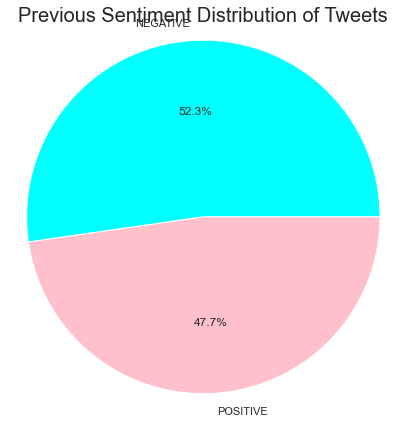

,index,Sentiment
0,NEGATIVE,10139
1,POSITIVE,9257


In [122]:
fig = plt.gcf()
fig.set_size_inches(7,7)
colors = ["cyan","pink","yellow"]
cleandf_pie=cleandf["Sentiment"].value_counts().reset_index()
plt.pie(cleandf_pie["Sentiment"],labels=cleandf_pie["index"],radius=2,colors=colors,autopct="%1.1f%%")
plt.axis('equal')
plt.title("Previous Sentiment Distribution of Tweets", fontsize=20)
plt.show()
cleandf_pie

#plt.savefig("Downloads/sent_dist_words.png")

In [4]:
#data18 = pd.read_csv('carbonMarket2018_2022.csv')
data18 = pd.read_csv('carbondata_21_221031.csv')

In [7]:
data18.tail()

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,Tweet_Id,Tweet,Hashtags,Conversation_Id,In_reply_To,Coordinates,Place
355224,SusHealthcare,False,2011-07-05 09:29:14+00:00,7488,4420,4,en,2021-01-01 01:00:22+00:00,5,Hootsuite Inc.,1344810662971715586,2020 was a year for the books. Amidst the pand...,"['netzero', 'greenspaceforhealth', 'climateact...",1344810662971715586,NaN,NaN,NaN
355225,LisaKayeCAP,False,2013-08-02 04:16:44+00:00,376,832,1,en,2021-01-01 01:00:03+00:00,1,LinkedIn,1344810585658175491,The race to #NetZero is accelerating. @Ann Met...,['NetZero'],1344810585658175491,NaN,NaN,NaN
355226,thegalonthego,False,2016-04-12 23:51:26+00:00,398,1346,0,en,2021-01-01 00:32:59+00:00,1,Twitter Web App,1344803774854881280,Excellent reminder\n\n#netzero #emissions,"['netzero', 'emissions']",1344803774854881280,NaN,NaN,NaN
355227,raularteche,False,2011-11-12 12:30:32+00:00,37,91,2,es,2021-01-01 00:11:37+00:00,3,Smarp.,1344798397019152384,Anunciamos la renovación de nuestra flota con ...,"['RedLovesGreen', 'NetZero', 'CeroEmisionesNet...",1344798397019152384,NaN,NaN,NaN
355228,raularteche,False,2011-11-12 12:30:32+00:00,37,91,2,es,2021-01-01 00:11:17+00:00,3,Smarp.,1344798313854414849,En Vodafone hemos dado un paso más y nos compr...,"['Planeta', 'Sostenibilidad', 'NetZero', 'Cero...",1344798313854414849,NaN,NaN,NaN


In [9]:
len(data18.columns.tolist())

17

In [178]:
data18['TweetC'] = data18['Tweet']
data18.head()

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,Tweet_Id,Tweet,Hashtags,Conversation_Id,In_reply_To,Coordinates,Place,TweetC
0,CarbonCredits,False,2017-06-21 17:44:31+00:00,6799,283,0,en,2022-10-31 23:36:00+00:00,5,Twitter Web App,1587226914174935043,Nigeria is pioneering a billion-dollar worth o...,"['CarbonCredits', 'CarbonOffsets', 'Netzero', ...",1587226914174935043,NaN,NaN,NaN,Nigeria is pioneering a billion-dollar worth o...
1,greenbuildermag,False,2010-03-08 17:02:15+00:00,9626,5456,0,en,2022-10-31 23:35:21+00:00,0,Metricool,1587226750240571393,Green Builder Media has joined forces with hou...,"['TheSondersProject', 'netzero', 'GreenBuilder...",1587226750240571393,NaN,NaN,NaN,Green Builder Media has joined forces with hou...
2,M_Costelloe,False,2012-05-03 02:19:44+00:00,604,819,0,en,2022-10-31 23:29:50+00:00,3,Twitter for iPhone,1587225362102386688,@anuearthscience @cosmicpinot Rare Earth Confe...,"['criticalminerals', 'netzero']",1587225362102386688,NaN,NaN,NaN,@anuearthscience @cosmicpinot Rare Earth Confe...
3,PauIRob,False,2014-02-02 11:58:19+00:00,297,97,1,en,2022-10-31 23:27:46+00:00,0,Twitter for iPad,1587224841773531137,Because your children deserve a ‘better’ world...,"['skypapers', 'cop27', 'netzero', 'ClimateEmer...",1587224841773531137,NaN,NaN,NaN,Because your children deserve a ‘better’ world...
4,Bahtiar041221,False,2022-01-27 00:18:11+00:00,156,1499,0,en,2022-10-31 23:26:58+00:00,0,Twitter Web App,1587224643131256832,OMG! NZTwork is launching their HARDWARE PRESA...,"['netzerotoken', 'nztwork', 'carboncredits', '...",1587224643131256832,NaN,NaN,NaN,OMG! NZTwork is launching their HARDWARE PRESA...


In [16]:
data18.dtypes

User               object
verified             bool
Date_Created       object
Follows_Count       int64
Friends_Count       int64
Retweet_Count       int64
Language           object
Date_Tweet         object
Number_of_Likes     int64
Source_of_Tweet    object
Tweet_Id            int64
Tweet              object
Hashtags           object
Conversation_Id     int64
In_reply_To        object
Coordinates        object
Place              object
dtype: object

In [33]:
data18['Place'].loc[data18['Place'].notnull()]

40        Place(fullName='Cambridge, England', name='Cam...
426       Place(fullName='Manchester, England', name='Ma...
472       Place(fullName='Sydney, New South Wales', name...
499       Place(fullName='Bracknell, England', name='Bra...
793       Place(fullName='Edinburgh, Scotland', name='Ed...
                                ...                        
354702    Place(fullName='Western Bay of Plenty District...
354790    Place(fullName='Wezembeek-Oppem, België', name...
354848    Place(fullName='Paynton No. 470, Saskatchewan'...
354917    Place(fullName='Sutton, London', name='Sutton'...
355008    Place(fullName='Oakington, England', name='Oak...
Name: Place, Length: 6739, dtype: object

In [45]:
# for plotting missing values

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['count']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='darkgrid')
    sns.barplot(x='Name', y='count', data=missing_values)
    plt.xticks(rotation=90)
    plt.title('Missing Values Fraction for Columns')
    plt.show()
    
    
#https://github.com/ShilpiParikh/EDA-on-COVID-19-tweets/blob/main/Covid19_tweets_EDA%20.ipynb

In [46]:
return_missing_values(data18)

Hashtags       0.000028
In_reply_To    0.899307
Coordinates    0.981029
Place          0.981029
dtype: float64

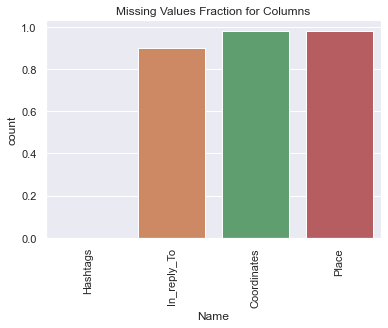

In [47]:
plot_missing_values(data18)

In [38]:
# unique values from data
def return_unique_values(data_frame):
    unique_dataframe = pd.DataFrame()
    unique_dataframe['Features'] = data_frame.columns
    uniques = []
    for col in data_frame.columns:
        u = data_frame[col].nunique()
        uniques.append(u)
    unique_dataframe['Uniques'] = uniques
    return unique_dataframe

#https://github.com/ShilpiParikh/EDA-on-COVID-19-tweets/blob/main/Covid19_tweets_EDA%20.ipynb

In [40]:
unidf = return_unique_values(data18)
print(unidf)

           Features  Uniques
0              User    66174
1          verified        2
2      Date_Created    66168
3     Follows_Count    16694
4     Friends_Count     7023
5     Retweet_Count      281
6          Language       54
7        Date_Tweet   348244
8   Number_of_Likes      586
9   Source_of_Tweet      460
10         Tweet_Id   355229
11            Tweet   346805
12         Hashtags   185054
13  Conversation_Id   345559
14      In_reply_To    15228
15      Coordinates     1531
16            Place     1492


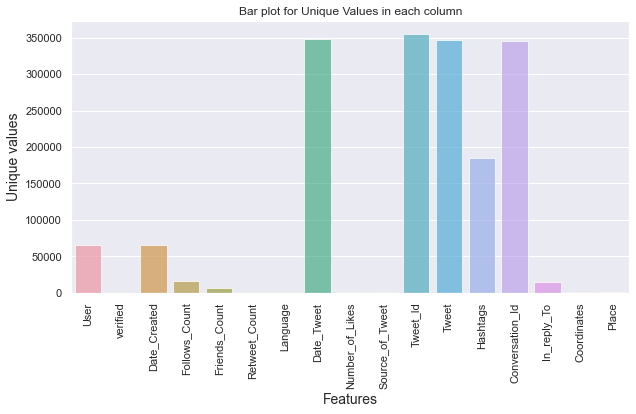

In [41]:
f, ax = plt.subplots(1,1, figsize=(10,5))

sns.barplot(x=unidf['Features'], y=unidf['Uniques'], alpha=0.7)
plt.title('Bar plot for Unique Values in each column')
plt.ylabel('Unique values', fontsize=14)
plt.xlabel('Features', fontsize=14)
plt.xticks(rotation=90)
plt.show()

#https://github.com/ShilpiParikh/EDA-on-COVID-19-tweets/blob/main/Covid19_tweets_EDA%20.ipynb

In [89]:
places = data18['Place'].loc[data18['Place'].notnull()].tolist()
places[1]

"Place(fullName='Bracknell, England', name='Bracknell', type='city', country='United Kingdom', countryCode='GB')"

In [108]:
places = data18['Place'].value_counts(ascending=False).rename_axis('unique_values').to_frame('counts')
places

,counts
unique_values,
"Place(fullName='Manhattan, NY', name='Manhattan', type='city', country='United States', countryCode='US')",759
"Place(fullName='Glasgow, Scotland', name='Glasgow', type='city', country='United Kingdom', countryCode='GB')",116
"Place(fullName='Virginia Water, South East', name='Virginia Water', type='city', country='United Kingdom', countryCode='GB')",95
"Place(fullName='Sevenoaks Weald, South East', name='Sevenoaks Weald', type='city', country='United Kingdom', countryCode='GB')",86
"Place(fullName='Edinburgh, Scotland', name='Edinburgh', type='city', country='United Kingdom', countryCode='GB')",70
...,...
"Place(fullName='Wahoo, NE', name='Wahoo', type='city', country='United States', countryCode='US')",1
"Place(fullName='Kota Lama Kanan, Perak', name='Kota Lama Kanan', type='city', country='Malaysia', countryCode='MY')",1
"Place(fullName='Kuala Kalumpang, Selangor', name='Kuala Kalumpang', type='city', country='Malaysia', countryCode='MY')",1


In [81]:
data18['Place'].loc[data18['Place'].notnull()]

472       Place(fullName='Sydney, New South Wales', name...
499       Place(fullName='Bracknell, England', name='Bra...
793       Place(fullName='Edinburgh, Scotland', name='Ed...
895       Place(fullName='Crystal Mini Market', name='Cr...
1009      Place(fullName='Worcester, England', name='Wor...
                                ...                        
354594    Place(fullName='Garston, England', name='Garst...
354702    Place(fullName='Western Bay of Plenty District...
354790    Place(fullName='Wezembeek-Oppem, België', name...
354848    Place(fullName='Paynton No. 470, Saskatchewan'...
355008    Place(fullName='Oakington, England', name='Oak...
Name: Place, Length: 4779, dtype: object

In [85]:
data18['Place'].iloc[793]

nan

In [ ]:
s.split(':')[0]

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, "Place(fullName='Manhattan, NY', name='Manhattan', type='city', country='United States', countryCode='US')"),
  Text(1, 0, "Place(fullName='Glasgow, Scotland', name='Glasgow', type='city', country='United Kingdom', countryCode='GB')"),
  Text(2, 0, "Place(fullName='Virginia Water, South East', name='Virginia Water', type='city', country='United Kingdom', countryCode='GB')"),
  Text(3, 0, "Place(fullName='Sevenoaks Weald, South East', name='Sevenoaks Weald', type='city', country='United Kingdom', countryCode='GB')"),
  Text(4, 0, "Place(fullName='Edinburgh, Scotland', name='Edinburgh', type='city', country='United Kingdom', countryCode='GB')"),
  Text(5, 0, "Place(fullName='Melbourne, Victoria', name='Melbourne', type='city', country='Australia', countryCode='AU')"),
  Text(6, 0, "Place(fullName='Paris, France', name='Paris', type='city', country='France', countryCode='FR')"),
  Text(7, 0, "Place(fullName='London, England', name='Lond

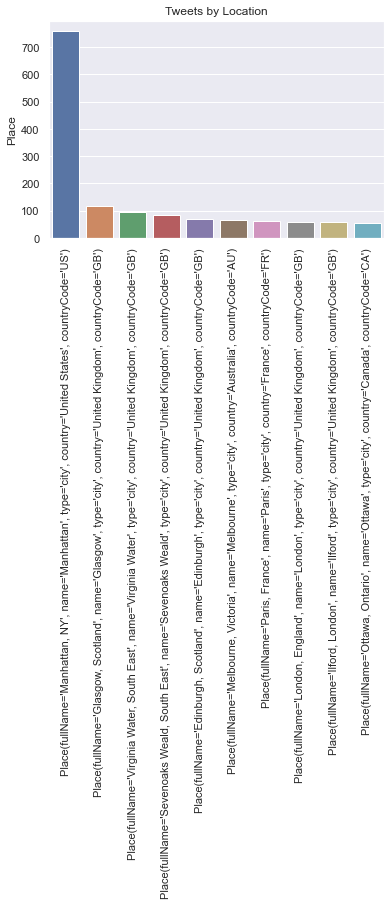

In [70]:
sns.barplot(x= data18.Place.value_counts()[:10].index,y=data18.Place.value_counts()[:10]).set(title='Tweets by Location')
plt.xticks(rotation=90)

### Pre-processsing

In [49]:
data18['Tweet'].iloc[3]

'Because your children deserve a ‘better’ world..\n\n#skypapers #cop27 #netzero #ClimateEmergency #ClimateScam #climatesame https://t.co/X4Q5EBtb74'

In [50]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
  
lemma = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

In [51]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\dantr\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [52]:
# the function to clean the tweet and tokenize them
def clean_tweet(tweet):
    if type(tweet) == float:
            return ""

    # turn text into lower
    test = tweet.lower()
    # remove all mentions and hashtags 
    test = re.sub("@[A-Za-z0-9_]+","", test)
    test = re.sub("#[A-Za-z0-9_]+","", test)
    #remove links
    test = re.sub(r"http\S+", "", test)
    test = re.sub(r"www.\S+", "", test)
    #remove punctuation
    test = re.sub('[()!?]', ' ', test)
    test = re.sub('\[.*?\]',' ', test)
    #remove non alphabetical characters
    test = re.sub("[^a-z0-9]"," ", test)
    #remove extra spaces
    test = re.sub(' +', ' ', test)
    # remove single letter words
    test = ' '.join( [w for w in test.split() if len(w)>1] )
    
    test = ' '.join( [lemma.lemmatize(x) for x in nltk.wordpunct_tokenize(test) if x not in stop_words])
    test =[lemma.lemmatize(x, nltk.corpus.reader.wordnet.VERB) for x in nltk.wordpunct_tokenize(test) if x not in stop_words]

    return test

In [151]:
# define a function to clean the tweet.
def clean_tweet2(tweet):

    tweet = tweet.lower()
    tweet = re.sub('https?:\/\/[a-zA-Z0-9@:%._\/+~#=?&;-]*', ' ', tweet)
    tweet = re.sub('\$[a-zA-Z0-9]*', ' ', tweet)
    tweet = re.sub('\@[a-zA-Z0-9]*', ' ', tweet)
    tweet = re.sub('[^a-zA-Z\']', ' ', tweet)
    tweet = ' '.join( [w for w in tweet.split() if len(w)>1] )
    
    tweet=' '.join([lemma.lemmatize(x) for x in nltk.wordpunct_tokenize(tweet) if x not in stop_words])
    tweet=[lemma.lemmatize(x,nltk.corpus.reader.wordnet.VERB) for x in nltk.wordpunct_tokenize(tweet) if x not in stop_words]
    return tweet

In [53]:
clean_tweet(data18['Tweet'].iloc[3])

['child', 'deserve', 'better', 'world']

In [54]:
# clean the tweets and create two columns: tokenized tweet and whole tweet
data18["clean_tweet"]=data18["Tweet"].apply(lambda x:clean_tweet(x))
data18["cleaned_tweet"]=data18["clean_tweet"].apply(lambda x:' '.join(x))

In [55]:
# we choose tweets in English and with at least 1 like
data18 = data18[data18['Language'] == 'en']
data18 = data18[data18['Number_of_Likes'] >= 1]

In [187]:
data18['clean_tweet'].iloc[4]

['measure',
 'emission',
 'first',
 'step',
 'address',
 'impact',
 'account',
 'service',
 'offer',
 'holistic',
 'approach',
 'address',
 'scope',
 'accordance',
 'protocol',
 'corporate',
 'account',
 'report',
 'standard']

In [188]:
data18['cleaned_tweet'].iloc[4]

'measure emission first step address impact account service offer holistic approach address scope accordance protocol corporate account report standard'

In [189]:
data18.shape

(225097, 20)

In [190]:
tweets = data18['clean_tweet']
tweets[:10]

0     [nigeria, pioneer, billion, dollar, worth, vol...
2                             [rare, earth, conference]
16    [patriot, hydrogen, launch, malaysia, first, m...
26          [sgp, patron, help, shape, print, industry]
28    [measure, emission, first, step, address, impa...
29    [article, actually, say, country, 50, billion,...
33    [look, forward, see, system, utilize, east, co...
34    [week, underway, egypt, start, learn, global, ...
35    [mr, goodwin, must, miss, un, wef, globalists,...
36    [build, sustainable, business, strategy, first...
Name: clean_tweet, dtype: object

### Hashtags

In [110]:
# define a function to clean the Hashtags.
def clean_hashtags(hashtags):
    '''
    hashtags: String
              Input Data
    hashtags: String
              Output Data
           
    func: Convert hashtags to lower case
          Replace ticker symbols with space. The ticker symbols are any stock symbol that starts with $.
          Replace everything not a letter or apostrophe with space
          Removes any spaces or specified characters at the start and end of hashtags.
          
    '''
    if hashtags:
        hashtags = hashtags.lower()
        hashtags = re.sub('\$[a-zA-Z0-9]*', ' ', hashtags)
        hashtags = re.sub('[^a-zA-Z]', ' ', hashtags)
        hashtags=hashtags.strip() 
    return hashtags

In [111]:
# clean the hashtags
data18["Hashtags"]=data18["Hashtags"].astype(str)
data18["Hashtags"]=data18["Hashtags"].apply(lambda x:clean_hashtags(x))

In [112]:
data18.head()

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,Tweet_Id,Tweet,Hashtags,Conversation_Id,In_reply_To,Coordinates,Place,clean_tweet,cleaned_tweet
0,CarbonCredits,False,2017-06-21 17:44:31+00:00,6799,283,0,en,2022-10-31 23:36:00+00:00,5,Twitter Web App,1587226914174935043,Nigeria is pioneering a billion-dollar worth o...,carboncredits carbonoffsets netzero a...,1587226914174935043,NaN,NaN,NaN,"[nigeria, pioneer, billion, dollar, worth, vol...",nigeria pioneer billion dollar worth voluntary...
2,M_Costelloe,False,2012-05-03 02:19:44+00:00,604,819,0,en,2022-10-31 23:29:50+00:00,3,Twitter for iPhone,1587225362102386688,@anuearthscience @cosmicpinot Rare Earth Confe...,criticalminerals netzero,1587225362102386688,NaN,NaN,NaN,"[rare, earth, conference]",rare earth conference
16,PatriotHydrogen,False,2022-08-15 11:29:38+00:00,7,1,2,en,2022-10-31 23:13:50+00:00,1,Twitter Web App,1587221338569478145,Patriot Hydrogen has launched in Malaysia with...,hydrogen greenhydrogen greenenergy ne...,1587221338569478145,NaN,NaN,NaN,"[patriot, hydrogen, launch, malaysia, first, m...",patriot hydrogen launch malaysia first many pr...
26,SGPPartnership,False,2012-09-05 15:14:54+00:00,1060,897,1,en,2022-10-31 23:05:05+00:00,1,Semrush Social Media Tool,1587219133929865231,SGP Patrons help shape a more #sustainablefutu...,sustainablefuture corporateresponsibility ...,1587219133929865231,NaN,NaN,NaN,"[sgp, patron, help, shape, print, industry]",sgp patron help shape print industry
28,PeriCarbon,False,2022-08-16 23:58:10+00:00,3,18,0,en,2022-10-31 23:02:17+00:00,2,Twitter Web App,1587218430645895168,Measuring #carbon emissions is the first step ...,carbon climate ghg esg netzero ...,1587218430645895168,NaN,NaN,NaN,"[measure, emission, first, step, address, impa...",measure emission first step address impact acc...


### DateColumns: + month, year columns

In [194]:
data18['date'] = pd.to_datetime(data18['Date_Tweet'], format='%Y-%m-%d')
data18['month'] = data18['date'].dt.month
data18['year'] = data18['date'].dt.year

In [195]:
data18.tail()

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,...,Conversation_Id,In_reply_To,Coordinates,Place,TweetC,clean_tweet,cleaned_tweet,date,month,year
355221,CryptoRiskGroup,False,2020-11-08 04:33:26+00:00,1205,4952,0,en,2021-01-01 02:55:17+00:00,1,Twitter Web App,...,1344839585898004480,NaN,NaN,NaN,Guest post: How human activity threatens the #...,"[guest, post, human, activity, threaten, carbo...",guest post human activity threaten carbon rich...,2021-01-01 02:55:17+00:00,1,2021
355223,MissionShunya,False,2019-03-31 02:40:21+00:00,318,215,2,en,2021-01-01 01:18:18+00:00,2,Twitter Web App,...,1344815177301037056,NaN,NaN,NaN,Happy New Year!\n\nLet's pledge to do our bit ...,"[happy, new, year, let, pledge, bite, transiti...",happy new year let pledge bite transition towa...,2021-01-01 01:18:18+00:00,1,2021
355224,SusHealthcare,False,2011-07-05 09:29:14+00:00,7488,4420,4,en,2021-01-01 01:00:22+00:00,5,Hootsuite Inc.,...,1344810662971715586,NaN,NaN,NaN,2020 was a year for the books. Amidst the pand...,"[2020, year, book, amidst, pandemic, saw, dema...",2020 year book amidst pandemic saw demand envi...,2021-01-01 01:00:22+00:00,1,2021
355225,LisaKayeCAP,False,2013-08-02 04:16:44+00:00,376,832,1,en,2021-01-01 01:00:03+00:00,1,LinkedIn,...,1344810585658175491,NaN,NaN,NaN,The race to #NetZero is accelerating. @Ann Met...,"[race, accelerate, mettler, andrillon, podcast...",race accelerate mettler andrillon podcast disc...,2021-01-01 01:00:03+00:00,1,2021
355226,thegalonthego,False,2016-04-12 23:51:26+00:00,398,1346,0,en,2021-01-01 00:32:59+00:00,1,Twitter Web App,...,1344803774854881280,NaN,NaN,NaN,Excellent reminder\n\n#netzero #emissions,"[excellent, reminder]",excellent reminder,2021-01-01 00:32:59+00:00,1,2021


In [113]:
list(data18['cleaned_tweet'][(data18['year']==2022)&(data18['month']==9)][:10])

KeyError: 'year'

### Turn tweets into embedding vectors 

In [44]:
!pip install -U gensim

     --------------------------------------- 23.9/23.9 MB 11.7 MB/s eta 0:00:00
     ------------------------------------- 983.8/983.8 kB 15.7 MB/s eta 0:00:00
  Attempting uninstall: Cython
    Found existing installation: Cython 0.29.24
    Uninstalling Cython-0.29.24:
      Successfully uninstalled Cython-0.29.24


In [196]:
#Converting the "clean_tweet" column in the format supported by embeddings.
sent = [row for row in data18["clean_tweet"]]
#use Gensim Phrases package to automatically detect common phrases (bigrams) from a list of sentences.
phrases = Phrases(sent, min_count=1, progress_per=50000)
bigram = gensim.models.phrases.Phraser(phrases)
sentences = bigram[sent]
sentences[1]

# https://www.kaggle.com/pierremegret/gensim-word2vec-tutorial 

['rare_earth', 'conference']

In [197]:
len(sentences)

225097

### Word2Vec model

In [198]:
#Initializing the word2vec model
w2v_model = Word2Vec(min_count=4,
                     window=5,
                     vector_size =300,
                     sample=1e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007, 
                     negative=20,
                     seed= 42,
                     workers=multiprocessing.cpu_count()-1)


#building vocab of the word2vec model from the custom data
w2v_model.build_vocab(sentences, progress_per=50000)

# https://towardsdatascience.com/unsupervised-sentiment-analysis-a38bf1906483

In [199]:
#training the word2vec model
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=60, report_delay=1)

(51360907, 177346140)

In [201]:
w2v_model.wv.most_similar(positive =["carbon"])

[('emission', 0.5598576664924622),
 ('farm_productivity', 0.4787425696849823),
 ('greenhouse_gas', 0.4655562937259674),
 ('offset_residual', 0.45276179909706116),
 ('carbon_footprint', 0.44694510102272034),
 ('provider_carbonneutral', 0.4391014277935028),
 ('remove_ghgs', 0.43749967217445374),
 ('reduce', 0.43422582745552063),
 ('switch_vertua', 0.43141525983810425),
 ('offset_unavoidable', 0.42592522501945496)]

In [202]:
#saving the word2vec model
w2v_model.save("word2vec.model")

In [203]:
#Loading the word2vec model
word_vectors = Word2Vec.load("word2vec.model").wv

### Clustering

In [204]:
#Feeding the embeddings to a KMeans model to cluster words into positive, negative, and neutral clusters
model = KMeans(n_clusters=3, max_iter=1000, random_state=42, n_init=50).fit(X=word_vectors.vectors.astype('double'))

In [207]:
# check what we have in each cluster to label the clusters
word_vectors.similar_by_vector(model.cluster_centers_[0], topn=200, restrict_vocab=None)

[('labour_libdems', 0.7927475571632385),
 ('throat', 0.7844064235687256),
 ('kowtow', 0.782042920589447),
 ('anti_fracking', 0.7816827297210693),
 ('cultist', 0.7810706496238708),
 ('dead_water', 0.7708773016929626),
 ('implode', 0.7647237181663513),
 ('pretend_something', 0.7628898024559021),
 ('90min', 0.7591031193733215),
 ('poor_vulnerable', 0.7581508159637451),
 ('total_b', 0.7574341893196106),
 ('unworkable', 0.7560237050056458),
 ('inept', 0.7555508017539978),
 ('wef_agenda', 0.7541081309318542),
 ('massacre', 0.7524727582931519),
 ('foretaste', 0.7514427304267883),
 ('ballot_box', 0.7469227313995361),
 ('religious', 0.7467252612113953),
 ('underlie_cause', 0.7454192042350769),
 ('fcuking', 0.7450405955314636),
 ('crisis_actor', 0.7447817921638489),
 ('wet_dream', 0.7442888021469116),
 ('torture', 0.7437711954116821),
 ('total_disaster', 0.7436293363571167),
 ('totally_wrong', 0.7430939674377441),
 ('globalists_politician', 0.742903470993042),
 ('fetish', 0.7427712678909302),
 (

In [209]:
# Labelling the clusters based on the type of words they carry
positive_cluster_center = model.cluster_centers_[1]
negative_cluster_center = model.cluster_centers_[0]
neutral_cluster_center= model.cluster_centers_[2]

In [222]:
#Creating a DataFrame of words with their embeddings and cluster values
words = pd.DataFrame(word_vectors.index_to_key)
words.columns = ['words']
words['vectors'] = words.words.apply(lambda x: word_vectors[f'{x}'])
words['cluster'] = words.vectors.apply(lambda x: model.predict([np.array(x)]))
words.cluster = words.cluster.apply(lambda x: x[0])

# https://towardsdatascience.com/unsupervised-sentiment-analysis-a38bf1906483

In [223]:
words

,words,vectors,cluster
0,amp,"[0.07874743, 0.108380824, -0.0063456777, 0.095...",1
1,net_zero,"[0.008779592, -0.32702243, 0.18982653, -0.3640...",1
2,emission,"[-0.03364873, 0.007788754, -0.056246445, -0.37...",1
3,new,"[0.22049752, 0.033542696, -0.17602187, -0.3385...",1
4,need,"[-0.10592899, 0.09529903, 0.080500744, -0.0258...",1
...,...,...,...
34572,safer_faster,"[0.080763854, 0.14341721, -0.47658885, -0.2650...",1
34573,immediacy,"[0.038642377, -0.025591485, -0.21957204, -0.09...",1
34574,multibillion_pound,"[-0.1570436, 0.26472902, -0.24957645, -0.18978...",1
34575,hideous,"[0.12516734, 0.014523674, -0.5922054, -0.31292...",0


In [224]:
#Assigning 1 to positive values, 0 to neutral and -1 for negative values
words['cluster_value'] = [1 if i==1 else 0 if i==2 else -1 for i in words.cluster]
words['closeness_score'] = words.apply(lambda x: 1/(model.transform([x.vectors]).min()), axis=1)

In [241]:
with pd.option_context('display.max_rows', None,):
    print(words[words["cluster_value"]==-1][:300].sort_values("closeness_score"))

                words                                            vectors  \
1221              ppl  [0.650828, 1.6795492, 0.5562937, 0.10844719, 0...   
868             boris  [-0.33551437, 1.7563875, -1.0237154, -0.859760...   
1078       wind_solar  [-0.2251152, 1.1444101, -1.4541452, -0.6976538...   
1220         morrison  [-0.05148441, 0.33381587, -1.1665766, 0.476167...   
1223          cheaper  [-0.51113576, 0.66964525, -0.6279917, -0.42391...   
1072              ban  [0.5425604, 1.3014003, 0.054051246, -0.3866854...   
1161     electric_car  [0.41359308, 0.3259452, -0.24115357, -0.458324...   
1070           winter  [0.7511588, 0.6455518, -1.5948646, -0.05675960...   
846         scientist  [0.7114922, 0.28360194, -0.6811638, -0.8574005...   
636              tree  [-1.1427224, -0.2907203, -0.48203737, -1.40336...   
1185        emergency  [0.65298814, 0.0027287947, -0.055670846, -1.26...   
1196         pandemic  [-0.27241492, 0.63738275, -0.733505, -0.812545...   
1198       s

In [246]:
positive = ['good','better','clean','fantastic','right',"hope", "improve","save", "innovation", "delight", "great"]
neutral = ['nuclear','india','australia','play','data','scotland','canada','job',"race","happens","grocery","person",
          'heat','house','may',"national","state"]
negative= ['risk','waste','carbon_footprint']
for i in positive:
    words.loc[words["words"]==i,"cluster_value"]=1
    
for i in neutral:
    words.loc[words["words"]==i,"cluster_value"]=0
    
for i in negative:
    words.loc[words["words"]==i,"cluster_value"]=-1

In [248]:
words[words["words"]=="dangerous"]

,words,vectors,cluster,cluster_value,closeness_score
1888,dangerous,"[-0.1639378, -0.061654735, -0.93385375, 0.3158...",0,-1,0.09594


### Sentiment analysis of words

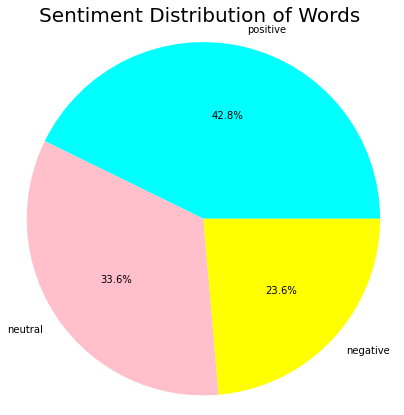

<Figure size 432x288 with 0 Axes>

In [426]:
# Plotting pie chart of Sentiment Distribution of words
emotion = {0: "neutral",
           1: "positive",
          -1: "negative"}

words["sentiments"]=words["cluster_value"].map(emotion)


fig = plt.gcf()
fig.set_size_inches(7,7)
colors = ["cyan","pink","yellow"]
df_pie=words["sentiments"].value_counts().reset_index()
plt.pie(df_pie["sentiments"],labels=df_pie["index"],radius=2,colors=colors,autopct="%1.1f%%")
plt.axis('equal')
plt.title("Sentiment Distribution of Words ", fontsize=20)
plt.show()
df_pie

plt.savefig("Downloads/sent_dist_words.png")

#### Out of 19911 unique words and bigram from the dataset:

11621 (33.61%) are Neutral sentiments
14786 (42.76%) are Positive sentiments
8170 (23.63%) are Negative sentiments

#### It shows that the Neutral and Positive words have larger domination in the dataset

### Custom sentiment analysis of tweets

In [254]:
# creating a dictionary of the word and its cluster value
words_dict = dict(zip(words.words, words.cluster_value))

In [396]:
# define a function to get the sentiment for the entire tweet
def get_sentiments(x,words_dict):
    '''
    x:         List
               Input data: Row of a DataFrame
    sent_dict: Dictionary
               Input: Dictionary of Words: Sentiments
    sentiment: String
               Output: Sentiment of the whole sentence
    
    Function: Getting sentiments of the entire sentence by averaging out the sentiments of individual words
    '''
    total=0
    count=0
    test=x["clean_tweet"]
    #print(test)
    for t in test:
        if words_dict.get(t):
            total+=int(words_dict.get(t))
            #print('adding', int(words_dict.get(t)))
        count+=1
    if count == 0:
        sentiment = 'no data'
    else:
        avg=total/count
        sentiment=-1 if avg<-0.15 else 1 if avg >0.15 else 0
    return sentiment

In [395]:
#x = data18.iloc[20]

total=0
count=0
#test=data18.iloc[2431]["clean_tweet"]
test=data18.iloc[0]["clean_tweet"]
print(test)
for t in test:
    if words_dict.get(t):
        total+=int(words_dict.get(t))
        print('adding', int(words_dict.get(t)))
    count+=1
if count == 0:
    print('ZERO ERROR')
    sentiment = 'no data'
else:
    avg=total/count
    sentiment=-1 if avg<-0.15 else 1 if avg >0.15 else 0
    
print('total:', total)
print('count:', count)
print('average:', avg)
print('sentiment:', sentiment)

['nigeria', 'pioneer', 'billion', 'dollar', 'worth', 'voluntary', 'carbon', 'market', 'africa', 'africa', 'carbon', 'market', 'initiative', 'acmi', 'estimate', 'nigeria', 'create', '30', 'million', 'carbon', 'credit', 'per', 'year', '2030']
adding 1
adding 1
adding 1
adding -1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
adding 1
total: 20
count: 24
average: 0.8333333333333334
sentiment: 1


In [399]:
for i in range(len(data18)):
    x = data18.iloc[i]
    data18['sentiment'][i] = get_sentiments(x, words_dict)

C:\Users\dantr\AppData\Local\Temp/ipykernel_22536/2313760499.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data18['sentiment'][i] = get_sentiments(x, words_dict)
C:\Users\dantr\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [400]:
data18.head()

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,...,In_reply_To,Coordinates,Place,TweetC,clean_tweet,cleaned_tweet,date,month,year,sentiment
0,CarbonCredits,False,2017-06-21 17:44:31+00:00,6799,283,0,en,2022-10-31 23:36:00+00:00,5,Twitter Web App,...,NaN,NaN,NaN,Nigeria is pioneering a billion-dollar worth o...,"[nigeria, pioneer, billion, dollar, worth, vol...",nigeria pioneer billion dollar worth voluntary...,2022-10-31 23:36:00+00:00,10,2022,1
2,M_Costelloe,False,2012-05-03 02:19:44+00:00,604,819,0,en,2022-10-31 23:29:50+00:00,3,Twitter for iPhone,...,NaN,NaN,NaN,@anuearthscience @cosmicpinot Rare Earth Confe...,"[rare, earth, conference]",rare earth conference,2022-10-31 23:29:50+00:00,10,2022,1
16,PatriotHydrogen,False,2022-08-15 11:29:38+00:00,7,1,2,en,2022-10-31 23:13:50+00:00,1,Twitter Web App,...,NaN,NaN,NaN,Patriot Hydrogen has launched in Malaysia with...,"[patriot, hydrogen, launch, malaysia, first, m...",patriot hydrogen launch malaysia first many pr...,2022-10-31 23:13:50+00:00,10,2022,1
26,SGPPartnership,False,2012-09-05 15:14:54+00:00,1060,897,1,en,2022-10-31 23:05:05+00:00,1,Semrush Social Media Tool,...,NaN,NaN,NaN,SGP Patrons help shape a more #sustainablefutu...,"[sgp, patron, help, shape, print, industry]",sgp patron help shape print industry,2022-10-31 23:05:05+00:00,10,2022,0
28,PeriCarbon,False,2022-08-16 23:58:10+00:00,3,18,0,en,2022-10-31 23:02:17+00:00,2,Twitter Web App,...,NaN,NaN,NaN,Measuring #carbon emissions is the first step ...,"[measure, emission, first, step, address, impa...",measure emission first step address impact acc...,2022-10-31 23:02:17+00:00,10,2022,1


In [380]:
counts = 0
for i in range(len(data18)):
    test = type(get_sentiments(data18.iloc[i], words_dict))
    if test is str:
        counts+=1
print(counts)
    #print('sentiment for', i, ':', get_sentiments(data18.iloc[i], words_dict))

180


In [401]:
# checking the value counts of each sentiment
data18["sentiment"].value_counts()

-1         102577
1          102013
0           20412
no data        95
Name: sentiment, dtype: int64

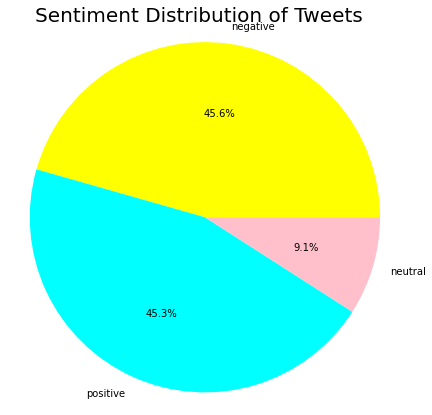

<Figure size 432x288 with 0 Axes>

In [427]:
# Plotting pie chart of Sentiment Distribution of tweets
emotion = {0: "neutral",
           1: "positive",
          -1: "negative"}

data18["sentiments_val"]=data18["sentiment"].map(emotion)
data_pie=data18["sentiments_val"].value_counts().reset_index()
fig = plt.gcf()
fig.set_size_inches(7,7)
colors = ["yellow","cyan","pink"]
plt.pie(data_pie["sentiments_val"],labels=data_pie["index"],radius=2,autopct="%1.1f%%", colors=colors)
plt.axis('equal')
plt.title("Sentiment Distribution of Tweets ", fontsize=20)
#plt.savefig("images/Sentiment_Distribution.png")
plt.show()
data_pie

plt.savefig("Downloads/sent_dist_tweets.png")

#### Out of 77467 tweets from the dataset:

102577(45.6%) are Negative sentiments
102577(9.1%) are Neutral sentiments
20412(45.3%) are Positive sentiments

In [405]:
#data18.to_csv('carbondata_labeled_custom1.csv', index=False)

In [406]:
data_negative = data18[data18["sentiment"]==-1]

In [473]:
# checking the cause of negative tweets in 2019
list(data18['cleaned_tweet'][(data18['year']==2021)&(data18['month'].isin([10,11]))])

['gtr transition operation seek develop project drill project carbon neutral secure full release gtr ax',
 'proud part generation',
 'financial sector make major climate pledge implement target bank take sectoral approach focus explain',
 'contribution pembina institute support electricity grid across canada progressive business coalition strategy cap emission much donate today',
 'oh people like desperate wake pursue fantasy prepare sacrifice disable people elderly',
 'new study mitigation pathway question overshoot',
 'force arbitrary arrest even murder fact continue soar since first incentivized voluntary 1997 abuse rural community',
 'amp concern india underdevelop world develop nation cannot look lens emerge mostly occidental construct global north',
 'great see student work support local business carbon reduction journey',
 'negotiation make clear play role achieve global climate objective need meet robust quantification methodology offer carbon credit st',
 'combat achieve need 

In [409]:
# some positive tweets
list(data18[data18["sentiment"]==1]["cleaned_tweet"][300:330])

['net zero 70k 2030 audacious level democratic heist require much advance plan',
 'important metal run short',
 'vote 2022 showcased arable farmer journey inspire u sequester huge amount carbon amp plan capitalise natural capital gain',
 'icymi koda praha join hyundai holtec international support construction smr 160 small modular reactor batch unit',
 'excellent idea get planet 2050 great use game play',
 'icymi lab get 150m upgrade infrastructure boost nuclear research amp development key component support grow u nuclear industry achieve future',
 'new climate news game changer idea water sustainability centre stage ahead major water conference',
 'icymi announce partnership support goal mover small modular reactor deployment',
 'icymi minister wilkinson position sector provider reliable affordable non emit global stage',
 'icymi announce wecan win edge cooperation advance partnership help country meet amp climate goal',
 'one thing story set clear upper bind specify minimum proporti

### Data Visualization

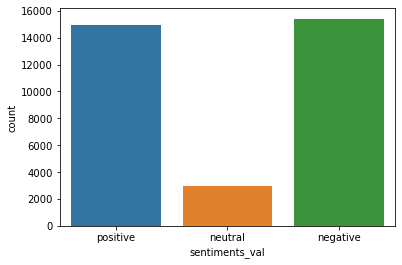

In [424]:
#data_list=["carbon","offsets","credit","blockchain"]
data_list=["carbon","offsets","credit","john oliver","oliver"]
pattern="|".join(data_list)
data18_2_sent=data18[(data18["cleaned_tweet"].str.contains(pattern))]
sns.countplot(x=data18_2_sent["sentiments_val"]);
plt.title("Sentiment Distribution of Tweets ", fontsize=20)
#plt.savefig("Downloads/johnoliver_sent2122.png")

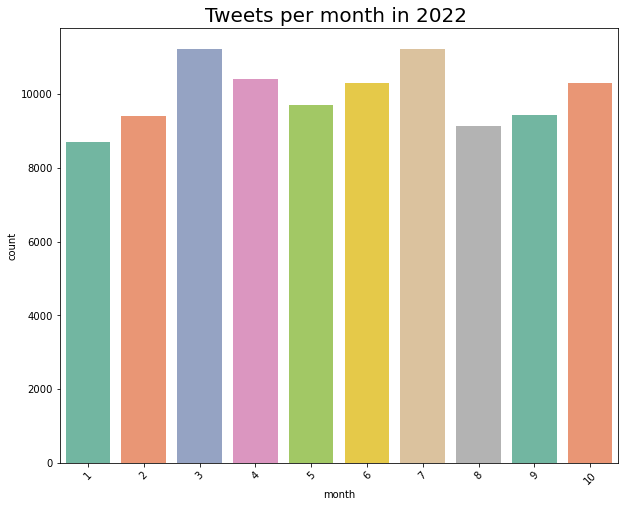

In [423]:
# plot Tweets count
plt.subplots(figsize = (10,8))
data22=data18[data18["year"]==2022]
chart = sns.countplot(x="month",data=data22, palette="Set2");
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title("Tweets per month in 2022 ", fontsize=20)
plt.savefig("Downloads/num_tweets2022.png")
plt.show();

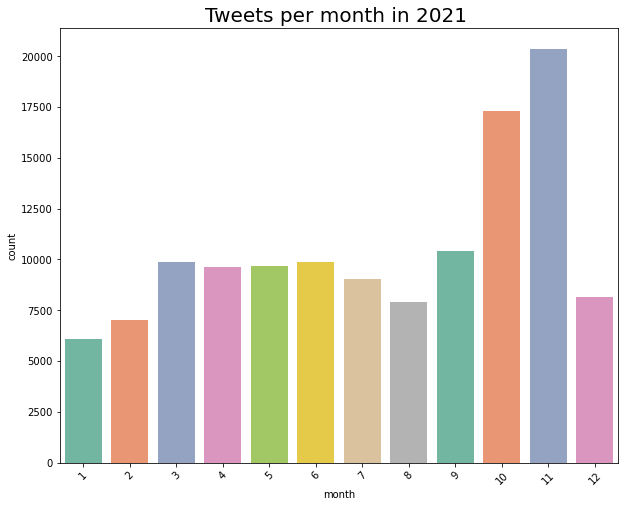

In [422]:
# plot Tweets count
plt.subplots(figsize = (10,8))
data21=data18[data18["year"]==2021]
chart = sns.countplot(x="month",data=data21, palette="Set2");
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title("Tweets per month in 2021 ", fontsize=20)
plt.savefig("Downloads/num_tweets2021.png")
plt.show();

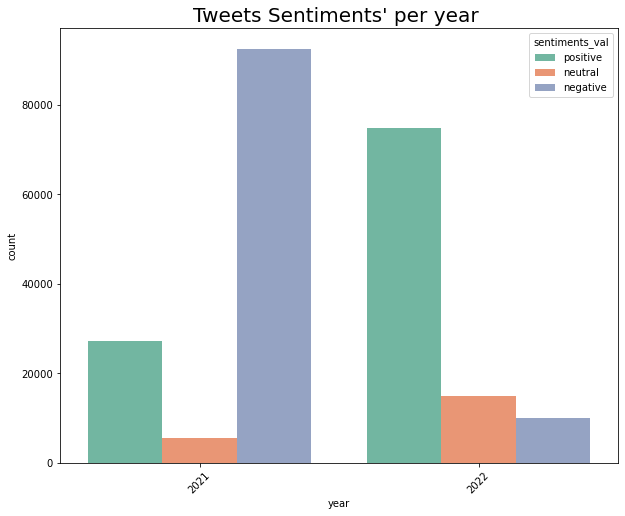

In [420]:
# plotting Tweets Sentiments for each year
plt.subplots(figsize = (10,8))
chart = sns.countplot(x="year",data=data18, palette="Set2",hue="sentiments_val");
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title("Tweets Sentiments' per year ", fontsize=20)
plt.savefig("Downloads/Tweets_per_year.png")
plt.show();

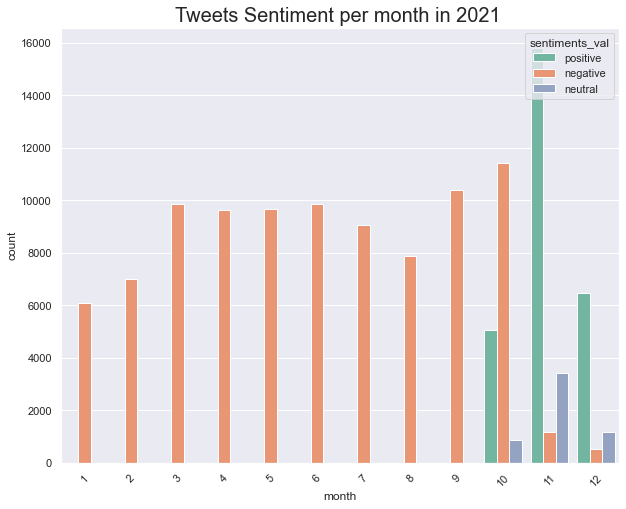

In [164]:
# plotting Tweets Sentiments for each year
plt.subplots(figsize = (10,8))
chart = sns.countplot(x="month",data=data21, palette="Set2",hue="sentiments_val");
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title("Tweets Sentiment per month in 2021 ", fontsize=20)
#plt.savefig("Downloads/Tweets_per_year.png")
plt.show();

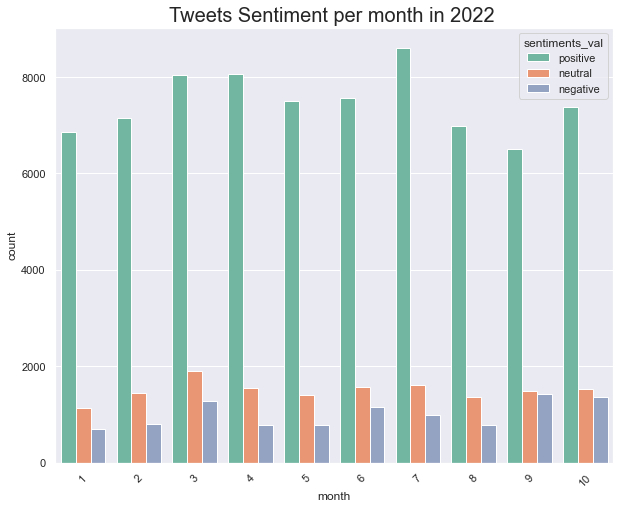

In [165]:
# plotting Tweets Sentiments for each year
plt.subplots(figsize = (10,8))
chart = sns.countplot(x="month",data=data22, palette="Set2",hue="sentiments_val");
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title("Tweets Sentiment per month in 2022 ", fontsize=20)
#plt.savefig("Downloads/Tweets_per_year.png")
plt.show();

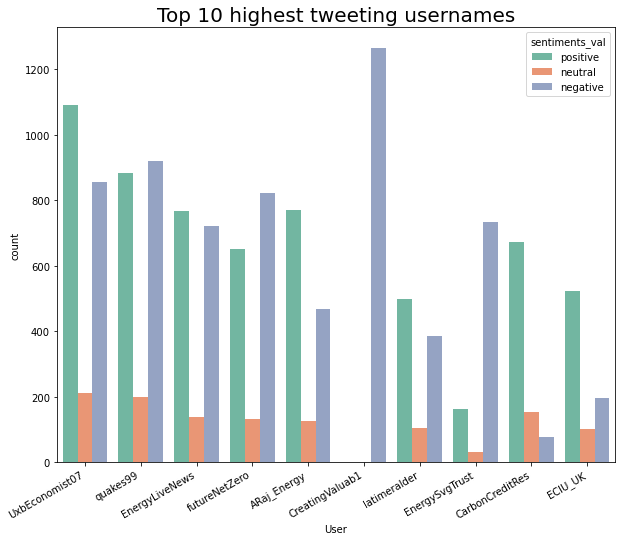

In [429]:
# Top 10 highest tweeting usernames
plt.subplots(figsize = (10,8))
plt.title("Top 10 highest tweeting usernames", fontsize=20)
chart=sns.countplot(x="User",hue="sentiments_val",data=data18,palette="Set2",
                    order= data18["User"].value_counts().iloc[:10].index);
chart.set_xticklabels(chart.get_xticklabels(), rotation=30, horizontalalignment='right');

plt.savefig("Downloads/top10_usernames_dist.png")

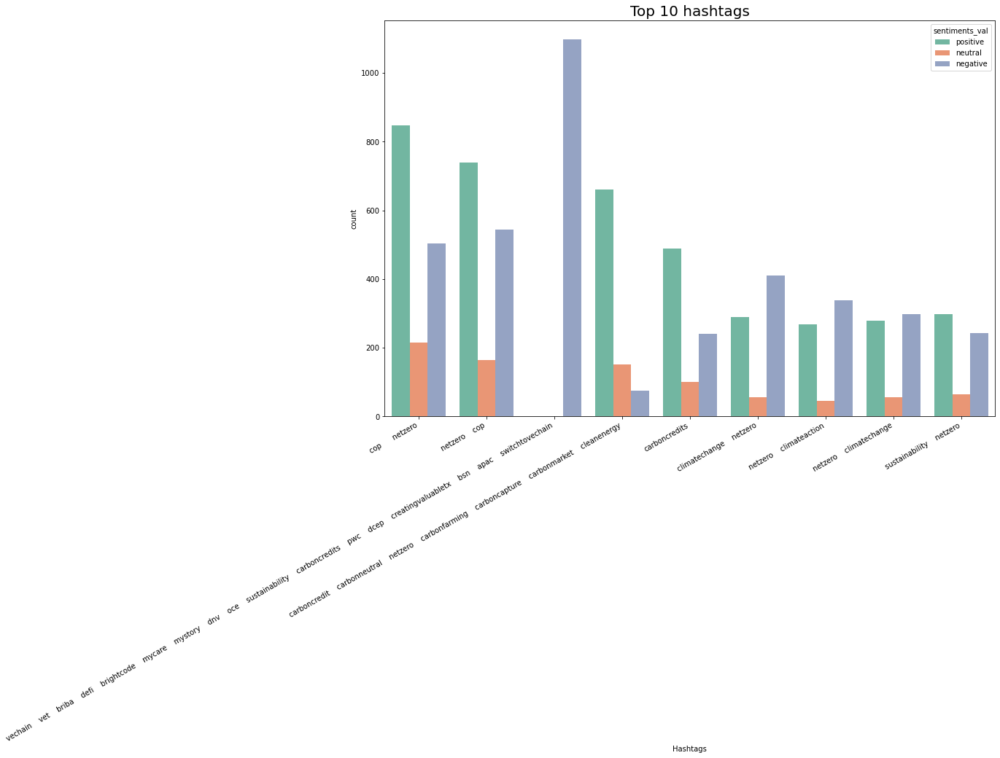

In [430]:
# plotting Top 10 hashtag
plt.subplots(figsize = (15,10))
plt.title("Top 10 hashtags", fontsize=20)
chart=sns.countplot(x="Hashtags",hue="sentiments_val",data=data18,palette="Set2",
                    order= data18["Hashtags"].value_counts().iloc[1:10].index);
chart.set_xticklabels(chart.get_xticklabels(), rotation=30, horizontalalignment='right');

plt.savefig("Downloads/top10_hashtags_dist.png")

### Wordcloud

In [24]:
def create_wordcloud(text):
    words=' '.join([words for words in text])
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(words)
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

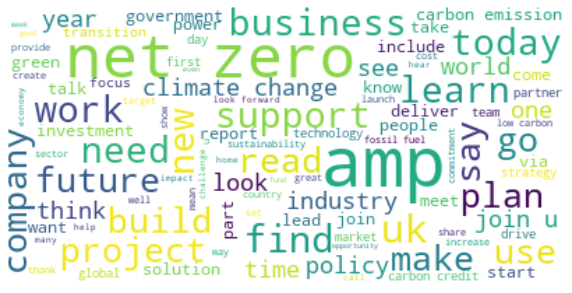

<Figure size 432x288 with 0 Axes>

In [434]:
#wordcloud for all tweets in 2022
create_wordcloud(data22["cleaned_tweet"].values)

plt.savefig("Downloads/wordcloud_22_1.png")

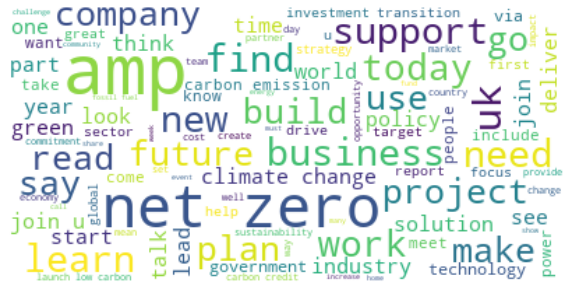

<Figure size 432x288 with 0 Axes>

In [435]:
#wordcloud for positive tweets
create_wordcloud(data22[data22["sentiment"]==1]["cleaned_tweet"].values)

plt.savefig("Downloads/wordcloud_22_pos1.png")

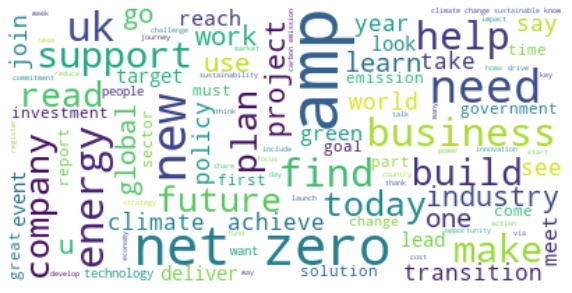

<Figure size 432x288 with 0 Axes>

In [436]:
#wordcloud for positive tweets
create_wordcloud(data22[data22["sentiment"]==-1]["cleaned_tweet"].values)

plt.savefig("Downloads/wordcloud_22_neg1.png")

### Sentiment Curve for 2022

In [437]:
data_list=["carbon","offsets","credit","blockchain","carbon credits", "carbon offsets"]
pattern="|".join(data_list)
data22_sent=data18[(data18["cleaned_tweet"].str.contains(pattern))]

data22_sent=data22_sent[data22_sent["year"]==2022]

In [444]:
len(data22_sent)

15007

In [443]:
data22_sent = data22_sent[data22_sent["sentiment"]!='no data']

In [445]:
data22_sent_gp=data22_sent.groupby(['month'])["sentiment"].sum()

In [446]:
data22_sent_gp=data22_sent_gp.reset_index()
data22_sent_gp

,month,sentiment
0,1,958
1,2,949
2,3,1038
3,4,1170
4,5,1016
5,6,918
6,7,1040
7,8,967
8,9,761
9,10,887


In [448]:
from sklearn import preprocessing

X = preprocessing.MinMaxScaler()
scaled_sent22= pd.DataFrame(X.fit_transform(data22_sent_gp.iloc[:,1:]),columns=data22_sent_gp.columns[1:])
scaled_sent22["month"]=data22_sent_gp["month"]

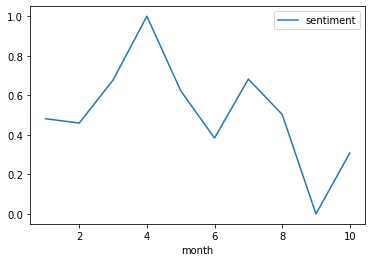

In [452]:
scaled_sent22.set_index('month').plot();

plt.savefig("Downloads/22_month_sent.png")

In [455]:
data22_sent=data18[(data18["cleaned_tweet"].str.contains(pattern))]
data21_sent=data22_sent[data22_sent["year"]==2021]

In [456]:
len(data21_sent)

18367

In [457]:
data21_sent = data21_sent[data21_sent["sentiment"]!='no data']
data21_sent_gp=data21_sent.groupby(['month'])["sentiment"].sum()

data21_sent_gp=data21_sent_gp.reset_index()
data21_sent_gp

,month,sentiment
0,1,-966
1,2,-1061
2,3,-1460
3,4,-1364
4,5,-1362
5,6,-1528
6,7,-1503
7,8,-1225
8,9,-1503
9,10,-1172


In [458]:
from sklearn import preprocessing

X = preprocessing.MinMaxScaler()
scaled_sent21= pd.DataFrame(X.fit_transform(data21_sent_gp.iloc[:,1:]),columns=data21_sent_gp.columns[1:])
scaled_sent21["month"]=data21_sent_gp["month"]

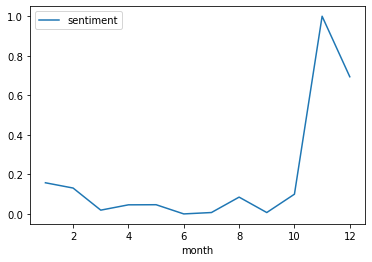

In [460]:
scaled_sent21.set_index('month').plot();

plt.savefig("Downloads/21_month_sent.png")

In [464]:
data22

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,...,Coordinates,Place,TweetC,clean_tweet,cleaned_tweet,date,month,year,sentiment,sentiments_val
0,CarbonCredits,False,2017-06-21 17:44:31+00:00,6799,283,0,en,2022-10-31 23:36:00+00:00,5,Twitter Web App,...,NaN,NaN,Nigeria is pioneering a billion-dollar worth o...,"[nigeria, pioneer, billion, dollar, worth, vol...",nigeria pioneer billion dollar worth voluntary...,2022-10-31 23:36:00+00:00,10,2022,1,positive
2,M_Costelloe,False,2012-05-03 02:19:44+00:00,604,819,0,en,2022-10-31 23:29:50+00:00,3,Twitter for iPhone,...,NaN,NaN,@anuearthscience @cosmicpinot Rare Earth Confe...,"[rare, earth, conference]",rare earth conference,2022-10-31 23:29:50+00:00,10,2022,1,positive
16,PatriotHydrogen,False,2022-08-15 11:29:38+00:00,7,1,2,en,2022-10-31 23:13:50+00:00,1,Twitter Web App,...,NaN,NaN,Patriot Hydrogen has launched in Malaysia with...,"[patriot, hydrogen, launch, malaysia, first, m...",patriot hydrogen launch malaysia first many pr...,2022-10-31 23:13:50+00:00,10,2022,1,positive
26,SGPPartnership,False,2012-09-05 15:14:54+00:00,1060,897,1,en,2022-10-31 23:05:05+00:00,1,Semrush Social Media Tool,...,NaN,NaN,SGP Patrons help shape a more #sustainablefutu...,"[sgp, patron, help, shape, print, industry]",sgp patron help shape print industry,2022-10-31 23:05:05+00:00,10,2022,0,neutral
28,PeriCarbon,False,2022-08-16 23:58:10+00:00,3,18,0,en,2022-10-31 23:02:17+00:00,2,Twitter Web App,...,NaN,NaN,Measuring #carbon emissions is the first step ...,"[measure, emission, first, step, address, impa...",measure emission first step address impact acc...,2022-10-31 23:02:17+00:00,10,2022,1,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170710,RealJohnWynne,False,2010-11-26 16:57:20+00:00,1086,1428,0,en,2022-01-01 00:43:01+00:00,1,Twitter for iPad,...,NaN,NaN,Massively improved public transport connectivi...,"[massively, improve, public, transport, connec...",massively improve public transport connectivit...,2022-01-01 00:43:01+00:00,1,2022,1,positive
170711,equitableenergy,False,2014-08-30 17:02:31+00:00,448,2616,1,en,2022-01-01 00:38:18+00:00,3,Twitter Web App,...,NaN,NaN,Thank you @RockefellerFdn @EnergyAlliance! End...,"[thank, end, heart, achieve, sustainable, amp,...",thank end heart achieve sustainable amp equita...,2022-01-01 00:38:18+00:00,1,2022,1,positive
170712,stratandbiz,False,2011-08-31 14:52:45+00:00,154372,4000,1,en,2022-01-01 00:30:06+00:00,3,Salesforce - Social Studio,...,NaN,NaN,How #NetZero goals set from afar may impact Af...,"[goal, set, afar, may, impact, africa, future,...",goal set afar may impact africa future develop...,2022-01-01 00:30:06+00:00,1,2022,0,neutral
170715,Cmh176Hughes,False,2013-01-10 01:09:09+00:00,281,728,1,en,2022-01-01 00:21:35+00:00,1,Twitter Web App,...,NaN,NaN,Shockwave from huge #explosion in five-story #...,"[shockwave, huge, five, story, silo, rock, haz...",shockwave huge five story silo rock hazmat spe...,2022-01-01 00:21:35+00:00,1,2022,1,positive


### EDA of results

In [3]:
#data22.to_csv('carbondata_labeled_custom22.csv', index=False)
#data21.to_csv('carbondata_labeled_custom21.csv', index=False)

data22 = pd.read_csv('carbondata_labeled_custom22.csv')
data21 = pd.read_csv('carbondata_labeled_custom21.csv')

C:\Users\dantr\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (23) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
data22

,User,verified,Date_Created,Follows_Count,Friends_Count,Retweet_Count,Language,Date_Tweet,Number_of_Likes,Source_of_Tweet,...,Coordinates,Place,TweetC,clean_tweet,cleaned_tweet,date,month,year,sentiment,sentiments_val
0,CarbonCredits,False,2017-06-21 17:44:31+00:00,6799,283,0,en,2022-10-31 23:36:00+00:00,5,Twitter Web App,...,NaN,NaN,Nigeria is pioneering a billion-dollar worth o...,"['nigeria', 'pioneer', 'billion', 'dollar', 'w...",nigeria pioneer billion dollar worth voluntary...,2022-10-31 23:36:00+00:00,10,2022,1,positive
1,M_Costelloe,False,2012-05-03 02:19:44+00:00,604,819,0,en,2022-10-31 23:29:50+00:00,3,Twitter for iPhone,...,NaN,NaN,@anuearthscience @cosmicpinot Rare Earth Confe...,"['rare', 'earth', 'conference']",rare earth conference,2022-10-31 23:29:50+00:00,10,2022,1,positive
2,PatriotHydrogen,False,2022-08-15 11:29:38+00:00,7,1,2,en,2022-10-31 23:13:50+00:00,1,Twitter Web App,...,NaN,NaN,Patriot Hydrogen has launched in Malaysia with...,"['patriot', 'hydrogen', 'launch', 'malaysia', ...",patriot hydrogen launch malaysia first many pr...,2022-10-31 23:13:50+00:00,10,2022,1,positive
3,SGPPartnership,False,2012-09-05 15:14:54+00:00,1060,897,1,en,2022-10-31 23:05:05+00:00,1,Semrush Social Media Tool,...,NaN,NaN,SGP Patrons help shape a more #sustainablefutu...,"['sgp', 'patron', 'help', 'shape', 'print', 'i...",sgp patron help shape print industry,2022-10-31 23:05:05+00:00,10,2022,0,neutral
4,PeriCarbon,False,2022-08-16 23:58:10+00:00,3,18,0,en,2022-10-31 23:02:17+00:00,2,Twitter Web App,...,NaN,NaN,Measuring #carbon emissions is the first step ...,"['measure', 'emission', 'first', 'step', 'addr...",measure emission first step address impact acc...,2022-10-31 23:02:17+00:00,10,2022,1,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99794,RealJohnWynne,False,2010-11-26 16:57:20+00:00,1086,1428,0,en,2022-01-01 00:43:01+00:00,1,Twitter for iPad,...,NaN,NaN,Massively improved public transport connectivi...,"['massively', 'improve', 'public', 'transport'...",massively improve public transport connectivit...,2022-01-01 00:43:01+00:00,1,2022,1,positive
99795,equitableenergy,False,2014-08-30 17:02:31+00:00,448,2616,1,en,2022-01-01 00:38:18+00:00,3,Twitter Web App,...,NaN,NaN,Thank you @RockefellerFdn @EnergyAlliance! End...,"['thank', 'end', 'heart', 'achieve', 'sustaina...",thank end heart achieve sustainable amp equita...,2022-01-01 00:38:18+00:00,1,2022,1,positive
99796,stratandbiz,False,2011-08-31 14:52:45+00:00,154372,4000,1,en,2022-01-01 00:30:06+00:00,3,Salesforce - Social Studio,...,NaN,NaN,How #NetZero goals set from afar may impact Af...,"['goal', 'set', 'afar', 'may', 'impact', 'afri...",goal set afar may impact africa future develop...,2022-01-01 00:30:06+00:00,1,2022,0,neutral
99797,Cmh176Hughes,False,2013-01-10 01:09:09+00:00,281,728,1,en,2022-01-01 00:21:35+00:00,1,Twitter Web App,...,NaN,NaN,Shockwave from huge #explosion in five-story #...,"['shockwave', 'huge', 'five', 'story', 'silo',...",shockwave huge five story silo rock hazmat spe...,2022-01-01 00:21:35+00:00,1,2022,1,positive


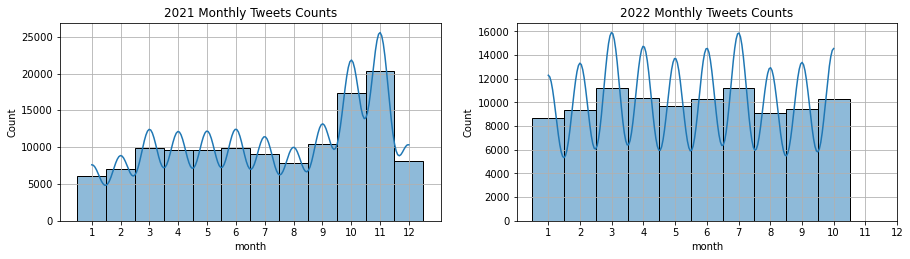

In [4]:
plt.figure(figsize=(15, 8)) 

plt.subplot(221) 
sns.histplot(x=data21.month,stat='count',binwidth=1,kde='true',discrete=True) 
plt.title('2021 Monthly Tweets Counts')
plt.xticks(np.arange(1,13,1)) 
plt.grid() 

plt.subplot(222) 
sns.histplot(x=data22.month,stat='count',binwidth=1,kde='true',discrete=True) 
plt.title('2022 Monthly Tweets Counts')
plt.xticks(np.arange(1,13,1)) 
plt.grid() 

C:\Users\dantr\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'Count')

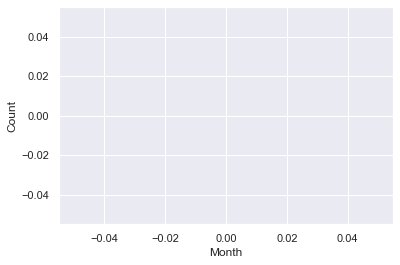

In [63]:
#ax=plt.subplot(221) 
sns.lineplot(data21.month.value_counts()) 
ax.set_xlabel("Month") 
ax.set_ylabel('Count') 

In [5]:
print(data21['TweetC'][data21['month']==9][:10])

45856    Well done to the @AusHydCouncil releasing its ...
45857    A friend in Melbourne told me they won't buy a...
45858    I was on the phone with Paul Polman the night ...
45859    Celebrating @BAFTA @WeAreALBERT 10th anniversa...
45860    #NetZero #renewable dependence &gt; European e...
45861    WSP were engaged by the ACT Government to deli...
45862    "We highlight three ‘bugs’ in the current syst...
45863    “The world’s biggest carbon-sucking machine is...
45864    A growing number of countries and companies ha...
45865    There's no time to waste #ClimateAction #Clima...
Name: TweetC, dtype: object


In [6]:
print(data21['clean_tweet'][data21['month']==9][:10])

45856    ['well', 'do', 'release', 'first', 'white', 'p...
45857    ['friend', 'melbourne', 'tell', 'buy', 'apartm...
45858    ['phone', 'paul', 'polman', 'night', 'appoint'...
45859    ['celebrate', '10th', 'anniversary', 'much', '...
45860    ['dependence', 'gt', 'european', 'energy', 'cr...
45861    ['wsp', 'engage', 'act', 'government', 'delive...
45862    ['highlight', 'three', 'bug', 'current', 'syst...
45863    ['world', 'biggest', 'carbon', 'suck', 'machin...
45864    ['grow', 'number', 'country', 'company', 'pled...
45865                                    ['time', 'waste']
Name: clean_tweet, dtype: object


In [5]:
data22 = data22[data22['cleaned_tweet'].notna()]

In [18]:
data21 = data21[data21['cleaned_tweet'].notna()]

In [ ]:
len(data22)

In [19]:
len(data21)

125226

Text(0.5, 1.0, 'Sentiment Distribution of Oliver Tweets')

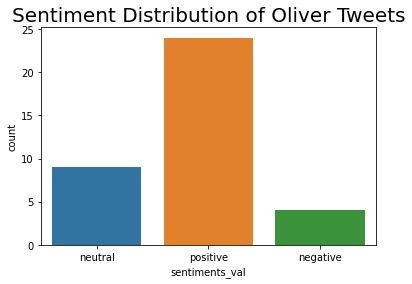

In [9]:
data_list=["john oliver","oliver"]
pattern="|".join(data_list)

data22_oliver = data22[data22['month'].isin([8,9])]
data22_oliver=data22_oliver[(data22_oliver["cleaned_tweet"].str.contains(pattern))]
sns.countplot(x=data22_oliver["sentiments_val"]);

plt.title("Sentiment Distribution of Oliver Tweets", fontsize=20)

Text(0.5, 1.0, 'Sentiment Distribution on Aug/Nov')

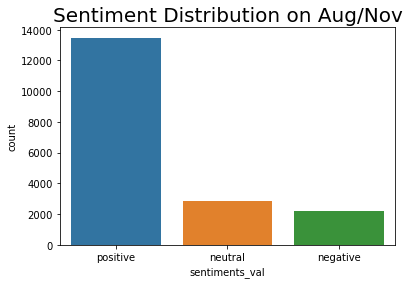

In [10]:
data22_fall = data22[data22['month'].isin([8,9])]
sns.countplot(x=data22_fall["sentiments_val"]);
plt.title("Sentiment Distribution on Aug/Nov", fontsize=20)

In [29]:
data21_1112 = data21[['Date_Tweet', 'Retweet_Count', 'TweetC',"cleaned_tweet",'sentiments_val']][(data21['month'].isin([10,11]))]
data21_1112 = data21_1112.sort_values(by=['Retweet_Count'], ascending=False)
data21_1112

,Date_Tweet,Retweet_Count,TweetC,cleaned_tweet,sentiments_val
25554,2021-11-02 23:02:08+00:00,649,How cool is this? The world’s first #netzero s...,cool world first steel hand cto invent process...,positive
38763,2021-10-18 07:25:08+00:00,616,Days ago Warren Entsch was supposedly talking ...,day ago warren entsch supposedly talk need com...,negative
41295,2021-10-12 17:59:45+00:00,603,Booking my travel for #COP26 - £330 (16hrs) fo...,book travel 330 16hrs return train 46 2hrs ret...,negative
29179,2021-10-30 08:59:11+00:00,536,The absolute nonsense of politicians arriving ...,absolute nonsense politician arrive multi car ...,positive
14741,2021-11-14 09:57:53+00:00,513,People are saying #COP26 was a waste of time -...,people say waste time far worse tie taxpayer p...,neutral
...,...,...,...,...,...
13605,2021-11-16 17:18:27+00:00,0,Low Carbon Development through Light Gauge Ste...,low carbon development light gauge steel build...,positive
13604,2021-11-16 17:19:44+00:00,0,A big #COP26 theme: big investors @PRI_News @M...,big theme big investor commit investment find ...,positive
26482,2021-11-02 11:50:40+00:00,0,3/3) And we’ll...\n\n🌱 Increase the number of ...,increase number nature base carbon sequester p...,positive
35326,2021-10-22 05:04:36+00:00,0,"👏 @ABBLbanking supports the industry-led, UN-c...",support industry lead un convene alliance cont...,negative


In [32]:
for i in range(len(data21_1112)):
    #if data21['sentiments_val'][i] == "positive":
    print("Date:", data21_1112['Date_Tweet'].iloc[i], data21_1112['sentiments_val'].iloc[i], data21_1112['TweetC'].iloc[i])

Date: 2021-11-02 23:02:08+00:00 positive How cool is this? The world’s first #netzero steel, handed to me by the CTO of ⁦@SSAB_AB⁩, who invented the process. This is what hope looks like #COP26 #Glasgow #hydrogen https://t.co/AFf4B7b9aK
Date: 2021-10-18 07:25:08+00:00 negative Days ago Warren Entsch was supposedly talking about how we need to commit to net zero by 2050.

Now he’s in Parliament voting against it. He says one thing in Cairns and another in Canberra. #auspol #NetZero https://t.co/q7maz3SMyy
Date: 2021-10-12 17:59:45+00:00 negative Booking my travel for #COP26 - £330 (16hrs) for a return on the train. £46 (2hrs) for a return on the airplane. Really not an ideal situation given the main COP agenda is how we reach #NetZero. I'll be sure to mention this to every UK politician I bump into there #ClimateCrisis
Date: 2021-10-30 08:59:11+00:00 positive The absolute nonsense of politicians arriving by multi-car cavalcades &amp; private jets to discuss the madness of a financial sy

Date: 2021-11-05 07:46:57+00:00 positive @LisaNEdwards @SPE_Token_BSC every Friday. Just migrated &amp; is absolutely flying. ecoNFT Carbon Credits with help from @PhantasmaChain &amp; just signed a tree planting deal with Pakistan for 1 Billion trees. You do the maths, lots of NFTs being minted &amp; sold to businesses to become #NetZero 🌳📈🚀
Date: 2021-11-08 11:07:40+00:00 positive One of the big #COP26 takeaways for me is how prominent #climate and #NetZero scepticism is. We might not see it, but posts from sceptics are getting huge engagement, enough to put them in the top 150 COP influencers (see https://t.co/ZJM2LmyfZ0) (🧵 1/3) https://t.co/xHLy1eZlYX
Date: 2021-10-20 14:53:38+00:00 negative Lots of terrible coverage for the government's #NetZero agenda, even from allies. A growing gulf between realists and zealots. I wonder how long it can survive in its present form, even assuming success at #FLOP26.
Date: 2021-11-10 14:11:56+00:00 positive Important discussion on #India ‘s Road

Date: 2021-11-03 14:30:03+00:00 positive #GHSCOP26 EVENT ALERT 🚨: @GFI_green's panel on #NetZero &amp; the SME Climate Opportunity will feature our CEO of Commercial Bank Paul Thwaite, @Lord_Bilimoria @City_McGuinness &amp; @BritishBBank's Catherine Lewis La Torre

📅- 4th Nov
⏰- 4.45 pm
📺- Register: https://t.co/aBnO8Sr4n8 https://t.co/cW8mOlHclB
Date: 2021-11-27 14:29:00+00:00 positive #ICYMI: A new issue of our newsletter is out! After the conclusion of #COP26, what are the key takeaways for the decentralized #RenewableEnergy sector? https://t.co/fdUl1qlRPL 

#SDG7 #NetZero #GreenEnergy #GlobalGoals #PoweringJobs
Date: 2021-11-04 19:49:00+00:00 neutral Reminder🤣🤣
#COP26 
You will be happy to know #India is planning #NetZero in 2070 

Only 50 years to go, like this. #methane readings on the ground.
#ClimateCrisis  #ClimateChange https://t.co/RB52QmEGnp
Date: 2021-11-24 14:00:26+00:00 positive #NetZero is a call-to-action to increase #ClimateAmbition, but the language can be confusing.

#COP26 https://t.co/Ok1qnjvkSB
Date: 2021-10-01 10:00:01+00:00 negative It's the final lights out for halogen bulbs💡

Starting from today we’re going #OneStepGreener &amp; phasing out sales of inefficient halogen light bulbs.

Saving the same CO2 as taking over half a million cars off the roads, helping us reach #NetZero by 2050.
https://t.co/TpG6Vzy2Va https://t.co/yvbrixrAPq
Date: 2021-11-25 12:10:18+00:00 positive 💷Balancing the UK's grid is becoming more and more expensive.

💡We need stable, low carbon #nuclear to complement renewables &amp; keep the grid steady as we progress to #netzero.

🤔 A month of balancing the grid at current prices would pay for an entire Small Modular Reactor.
Date: 2021-11-10 11:54:38+00:00 positive Thank you @grantshapps for visiting our facilities and seeing our progress on Jet Zero, part of the UK Government’s 10 point plan for a green revolution. #NetZero #RollsRoyceCOP26
Date: 2021-11-04 12:39:54+00:00 positive BREAKING: New #coal phase-out announcem

Date: 2021-11-11 10:31:37+00:00 positive We’re excited to welcome @iainastewart &amp; @GeorgeAdam to the launch of Scotland’s International Environment Centre later today, working with partners @UKGovScotland @scotgov @ClacksCouncil @StirlingCouncil &amp; @FVCollege to support jobs, growth &amp; a #JustTransition to #NetZero https://t.co/5lsU80lYFq
Date: 2021-11-01 07:45:12+00:00 positive Researchers from the University of Oxford have found cycling is 10x as important for reaching #NetZero carbon cities as #EVs⚡️🚘 yet unlike electric vehicles, e-bikes⚡️🚴 currently receive £0 in Government subsidies?!  https://t.co/M4Z0jkm0PJ #COP26 #COP26Glasgow
Date: 2021-10-29 15:01:19+00:00 positive #Music4SDGs @coldplay #NetZero The Music of the Spheres tour will be powered by #solar panels, waste cooking oil - and fans’ feet. #BuildSustainableNow 

@amitabhk87 @VishalDadlani @kiranshaw @SDG2030 @RobertoValentUN @kumarmanish9 @hollywoodcurry  
 https://t.co/RFeAGDpyAp
Date: 2021-11-11 11:01:08+00:0

Date: 2021-10-19 23:14:55+00:00 negative While we wait for the government to decide on #netzero emissions, why don’t we catch up on some reading? 🔥🌏 Here are some titles to keep you informed 👉🏼

Download or purchase https://t.co/aPug9y7UPx

#Envionmentalism
#NetZeroBy2050  
#NetZeroStrategy
#Climate 
#auspol https://t.co/2Z3e6k7heh
Date: 2021-10-13 00:19:21+00:00 negative Great resource for understanding #CarbonCredits "The Ultimate Guide to Understanding Carbon Credits" https://t.co/QHfA5J30yq via @CarbonCredits #ESG #CSR #CO2removal #Sustainability
Date: 2021-11-03 20:11:00+00:00 positive #COP26 #financeday global #financial co.s controlling 40% global assets to commit to #ParisAgreement 1.5C degree limit - #GFANZ members to report annually. #ACFview #ESG Webinar https://t.co/jxMw8WcCxv #ClimateAction #netzero #transitionrisk #togetherforourplanet @COP26 @UN https://t.co/TMf8oDHzxW
Date: 2021-11-09 09:32:11+00:00 positive 1/3 Ensuring that business #netzero targets are based on scien

Date: 2021-11-03 14:40:03+00:00 neutral Work has already begun on some of the UK’s first #netzero schools being built by our #Construction teams for the @educationgovuk. The projects are being delivered using modern methods of construction. Read more about our #zerocarbon schools: https://t.co/si1mBTYK1P #WatesCOP26 https://t.co/RIEbdR5i9O
Date: 2021-10-20 13:40:01+00:00 negative Technology brings the potential to not just change how we achieve a sustainable future, but to completely transform it. Here are four ways tech can speed up the journey to #netzero. https://t.co/aiJ4nkwJZ4 https://t.co/c5ulXIRXC2
Date: 2021-10-04 15:49:06+00:00 negative After a month of very poor Wind the supplies to National grid were circa 2-4% Wind &amp; consistent max 5% contribution from Solar. How on Earth when there’s intense #Energy demand in Winter is that going to keep Britain’s lights on? This is just sheer lunacy! 😮 #NetZero @spectator
Date: 2021-11-03 14:51:50+00:00 positive The @Breakthrough Ener

Date: 2021-11-04 15:54:32+00:00 positive "I want to share very good news with you", says @fbirol at our #COP26 event. If all the pledges from the last few days were implemented, incl. on #netzero or methane emissions, the global temperature increase would be limited to 1.8C.
https://t.co/ZU2bEghOEQ https://t.co/YjILENkrkP
Date: 2021-11-04 15:45:04+00:00 positive Interesting talk from @SkyZeroOfficial on sport as cultural asset and operator in the green transition.

The primary recommendation?

Government must be a more proactive actor in facilitating #NetZero.

The @Conservatives must use all the mechanisms available.
#COP26 https://t.co/VEtftfciBw
Date: 2021-11-06 08:30:09+00:00 positive 🚨NEW POLICY PAPER 💭

As #COP26 and #YES26 commence, we are delighted to present our policy report on how AI &amp; Distributed Ledger technology can hit #NetZero 

🗣️Written by: Alex Game (@Manugame100) &amp; Louis Scott 
Edited by: @Con_Tomlinson

📜The paper: https://t.co/FJWGIzvNhU https://t.co/QQJAg

Date: 2021-10-18 14:00:02+00:00 negative @NHSSupplyChain has worked with @boltonnhsft to help reduce #FoodWaste at ward-level to just 6% annually, resulting in an estimated annual saving of over £100,000. Read more here on the role of food and #catering in helping to deliver a #NetZero #NHS - https://t.co/PByUtbBE1a https://t.co/1mqTvq03pi
Date: 2021-11-02 07:05:32+00:00 positive Unveiled at #COP26: we've developed a carbon footprint estimator for SMEs committed to net zero thru @SMEClimateHub, w/ support from @Googleorg . Many SMEs don't attempt #netzero because of the perceived financial cost – this free tool aims to change that.
https://t.co/CyEAcLCBd8
Date: 2021-11-07 20:38:07+00:00 positive After our first week @COP26, we share our key @BNPParibasUK highlights thread from the #climateaction conference so far. Climate science, collaboration and supporting a just transition are vital on the pathway to #netzero ⬇️ https://t.co/zgXT0tpwwL
Date: 2021-10-04 13:56:59+00:00 negative So yo

Date: 2021-10-20 07:26:56+00:00 negative By proving the policies, technologies and market structures to reach #netzero electricity, the #G7 has opportunities to drive change and support raising ambitions

Read more in the full report, free to download:
https://t.co/jPnKsYcl3o
Date: 2021-10-19 15:42:22+00:00 negative Time to rethink transport taxation - towards road-pricing that creates funds for walking, cycling and public transport... as Chancellor says new taxes will be needed to replace fuel duty in #NetZero push https://t.co/aJ2zrdeOgp
Date: 2021-11-09 12:00:01+00:00 positive ❗LAUNCH: Glasgow Declaration on Climate Action in Tourism, a global effort to cut emissions in half and reach #NetZero by 2050 in the #TourismSector 🌏🙌🏼
Find out more: https://t.co/DPyf4Q8ko6

#GlasgowDeclaration #SustaianbleTourism @jorgelaguna @UNWTO @UNEP @COP26 https://t.co/i9lZmUH7Pp
Date: 2021-11-08 14:35:32+00:00 positive Real honour to be listening to ⁦@BarackObama⁩ at #COP26 “cynicism is the recourse 

Date: 2021-11-05 18:00:23+00:00 positive “If you’re looking for where to start to influence consumer behaviour, think about your own employees. Next generation activism is already wired into the workforce. Build sustainable behaviours from the inside out.” Wendy Clark, CEO dentsu international
#cop26 #change #netzero https://t.co/QKl8lvPe7O
Date: 2021-11-10 22:10:15+00:00 positive #TamilNadu government is forming a public company to tackle climate change. What a fascinating institutional innovation response to meet this moment! Among the things it aims to tackle is helping the state achieve #netzero emissions! #cop26 #Climateaction https://t.co/LoRLNJWtdO
Date: 2021-11-10 22:21:01+00:00 neutral @ScottMorrisonMP s plan to reach #NetZero emissions by 2050 was quickly revealed to be based on laughable projections. The latest projections for emissions to 2030,  reveal the government has totally given up on the #ParisAgreement  https://t.co/pROeIdIq5y #auspol #ScottyTheLiar
Date: 2021-10-29

Date: 2021-11-04 17:57:56+00:00 positive Geiger Counter Ltd $GCL actively-managed #Uranium equities Fund🍒 in London🇬🇧 closed Up +3.6% today at a new 9-year high of 65.50GBp 🌋🤠🐂 #investing #U3O8 #Nuclear #CarbonFree 24/7 #CleanEnergy #NetZero #mining #stocks #ESG #NetZeroNeedsNuclear #COP26 🏄‍♂️ https://t.co/MONjrVr77u
Date: 2021-10-05 19:59:21+00:00 negative Pure Extraction Announces Name Change to First Hydrogen Corp.

Full Story: https://t.co/glAoGDtJbf

 @pureextractco2 $PURX.CA $PURXF #fuelcell #hydrogen #carboncapture #climateaction #netzero #Energy #CleanEnergy #Transportation #RenewableEnergy #AlternativeEnergy #SmallCaps
Date: 2021-11-30 12:52:00+00:00 positive New LawFin #WorkingPaper by @aagozlugol that evolved during his fellowship at our Center. Read his findings on strategies to address the challenges of #ClimateChange: https://t.co/jUoGFmHImT
#NetZero #Sustainability #ESG https://t.co/sh0R8dt0oc
Date: 2021-10-05 18:07:00+00:00 negative Book your place. Two weeks to go! Hy

#techforgood #trusteddata #sustainabilityreporting #SDGs #ESG #greenfinance #sustainability #netzero https://t.co/acdLalMv5I
Date: 2021-11-08 12:00:34+00:00 positive @LdnSusSchools @LDN_environment @sabrodrigues61 @AdeAdepitan @VickNHope CONGRATS everyone! 👏🏼👏🏼😀😀🍃💚🌎 Amazing #London #Schools setting the bar high. 

More work ahead to get all 3500 London schools help deliver #NetZero by 2030

“Think like a system; Act as a sector”  #LCAW2022 @climate_london @london_climate @ICLEI_advocacy #COP26
Date: 2021-10-05 12:29:47+00:00 negative Speaking at #Expo2020/Plenary Session from Kazakhstan; @flacamera recognizes the ambitious leadership of #Kazakhstan on the pathway twds #NetZero, highlights the importance of #GreenHydrogen as well as Central Asia’s role in #energytransition w/its untapped #renewables potential. https://t.co/Fd6BMtBxbM
Date: 2021-11-04 09:41:00+00:00 positive 1000 CITIES Initiative Launch A Campaign To Urge City’s Leaders To Reject Fossil Fuels
https://t.co/fVwD4OdWEu
#CO

Date: 2021-10-14 08:15:03+00:00 negative Thanks to @NLinUK &amp; @HollandUKTrade for partnering with us to bring you #PlanetData4. We will be featuring SME's from our North Sea neighbours working on projects NOW to deliver #netzero @TransformWaste, @ThePlasticWhale &amp; @net2grid Join in below https://t.co/hFoOJBtAQ8
Date: 2021-11-20 07:30:00+00:00 positive #NewStudy

How much would #India need to achieve #netzero by 2070?

Read the new @CEEW_CEF analysis for more👇
Date: 2021-10-14 08:15:11+00:00 negative Will we see you tomorrow at @HgtConventions for the Net Zero Business Conference?

✅Great networking opportunities 
✅Awesome guest speakers 
✅ Learn from other local businesses, including @YorkshireWater &amp; @Taylors about their journey to #NetZero 

Sign up now!👇
Date: 2021-11-20 07:55:00+00:00 positive .@jayantsinha: #Decarbonisation pathways provide superior economic and health outcomes for India, and are also essential for its competitiveness. #Netzero is net positive for India

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Living in #Barnsley, (or outlying villages like Penistone, Silkstone, Thurnscoe, Grimethorpe or Cawthorne)? Worried about the #ClimateEmergency? Come along to one of these public meetings to air your views on how @BarnsleyCouncil can get to #NetZero ASAP!

@ChronOnline pls share!
Date: 2021-11-08 16:04:09+00:00 positive From the seabed to space, CGI is trusted to do complex things well. 

As a responsible business see how we are accelerating our climate action and journey to #netzero. https://t.co/Eggdql1krp
Date: 2021-11-23 08:30:00+00:00 positive Catch our CEO @dougj_p this coming 🗓️Friday 26 Nov in discussions about the challenge to decarbonise the supply chain with @rupertrowling 

#netzero #blockchain
Date: 2021-11-15 11:53:44+00:00 positive This Friday @ 2.00pm (Dublin), the IIEA/@ESBGroup welcome Prof. @OSullivanMeghan of @Kennedy_School who will discuss 'The Geopolitics of the Energy Transition' &amp; consider how the race to #NetZero will impact international relations.

Sign

Date: 2021-11-11 15:18:35+00:00 positive Today at #COP26 event organised by @ConstructionCLC  Dr Michelle Agha-Hossein spoke on behalf of Actuate UK on importance of retrofit in achieving #netzero for #builtenvironment. https://t.co/e7QyJmvzhS
Date: 2021-11-11 15:19:58+00:00 neutral #TEWeek21 is all about showcasing how #engineers and engineering play a big part in helping the UK achieve its #netzero ambition.
Collins gives up his time to spread the knowledge of #STEM #careers and the diverse range of opportunities there are. https://t.co/vK5uE860Tp https://t.co/L8azLBQ1wY
Date: 2021-11-18 08:29:02+00:00 positive We hear so much about the low ambition target of #NetZero by 2050 so it's refreshing to read "the goal of being carbon positive by 2023"! As many said at #COP26, it's not the way that's missing, it's the will!

@SydOperaHouse @FifthEstateAU #ClimateAction

https://t.co/B37CvmBJFz
Date: 2021-11-30 12:49:23+00:00 negative On we go to @Paulgrey_FHH’s presentation “Foodpath to #su

Date: 2021-10-22 07:37:52+00:00 negative The Global Wind Energy Manifesto for 
@COP26 sets out 8 actions needed to scale up wind to meet #netzero:
4️⃣ Implement streamlined, sensible permitting schemes for #renewableenergy projects to accelerate deployment &amp; minimise project attrition.
#WindAreYouIn https://t.co/SnzYBgSLGS
Date: 2021-10-22 07:44:44+00:00 negative Today we're getting involved with the @TheGreenParty conference, hosting a tour of @EBRI_UK, running a fringe session on 'Biomass for #netzero?' and having a conference stall all afternoon - come and see us if you're going to be there! #GPC21 #GPConf https://t.co/YEZfnvirHf
Date: 2021-10-21 11:30:45+00:00 negative #China's NDRC, NEA, MIIT, MEE, SAMR issue guidance to cut power consumption and carbon emission in some industries.
#NetZero #energycrunch
https://t.co/7ePx0ooSkk
Date: 2021-11-17 09:06:00+00:00 positive @Honda has asked its major parts suppliers to achieve net zero carbon dioxide emissions by 2050, making the au

https://t.co/SqBLOrlbYB
Date: 2021-10-28 10:00:46+00:00 positive UK-wide hydrogen trials for HGVs to start next year. CNG Fuels has pledged to dedicate 100 acres of its land portfolio to hydrogen HGV refuelling by 2025. 

#NetZero #climatechange #Sustainability #Greenfuture

@CNG_FUELS 
https://t.co/WupowYH8OT
Date: 2021-10-28 10:00:29+00:00 positive 📢 EXCITING ANNOUNCEMENT 📢

Graeme Dey, Minister for Transport in Scotland, will be attending Low Carbon Logistics to officially open the event! 

@networkrail @transcotland @scotent @ScotEngineering 

#pullingtogetherfornetzero #netzero #lowcarbonlogistics #cop26 https://t.co/eAPDI6DkMt
Date: 2021-10-28 10:00:25+00:00 nan @MMinevich writes for @Forbes on 11 different examples of solutions that are using AI to achieve net-zero.
Data drives innovation to help improve society; that's why https://t.co/BGECFGZiJw believe in safe and simple data sharing!
https://t.co/Yu1z5uGO3X
#data #climate #NetZero https://t.co/JR1CWwrRRm
Date: 2021-11-11 19:

Date: 2021-10-28 21:30:06+00:00 neutral Big Oil loves to make #NetZero pledges to curb #ClimateChange because they love bullshit. Biden, Congress, and all others must say “no-to-the-net!” and drastically reduce emissions by 2030 through absolute reductions. https://t.co/rCsH2ZLBWL
Date: 2021-10-28 21:28:32+00:00 positive A warm welcome and great visit to @TERCfacilities @energyshef for their Next Steps to #NetZero event. Thanks to Alix Morfoisse and her colleagues! Here’s the #CarbonCapture set up https://t.co/HmSo9jo8YQ
Date: 2021-11-11 14:25:34+00:00 positive After 2 full weeks of COP26, I am attending the Scottish Government's final event - Scotland's #RaceToZero. Since the launch of the campaign in June 2020, 226 Scottish companies have signed up, making their pledge to reach #NetZero before 2050. More needed by all of society.
Date: 2021-10-28 21:12:29+00:00 positive Secret Liberal group pushed for net zero to halt the Nationals https://t.co/xofxx1oBZy

This is what you get with t

Date: 2021-10-27 10:26:45+00:00 positive Just got a revision of the Australian net zero plan  #COP26 #NetZero #Scomo https://t.co/Wa7QVkBmsb
Date: 2021-10-27 10:25:09+00:00 positive Fantastic to be able to contribute to @EnergyExpertUK's Green Game Changers resource for businesses looking for support and guidance in reducing #carbonemissions and working towards #netzero goals.  

Get your copy of this free resource here: https://t.co/8tzQByMjB0 https://t.co/9E2mt5ydEH
Date: 2021-11-12 12:21:27+00:00 positive Shell and RWE have joined forces to accelerate the production and distribution of green hydrogen. Do you think this alliance will boost green hydrogen production?

@Shell_UKLtd
@RWE_UK

#greenhydrogen #netzero #RWE #Shell #CarbonCapture

https://t.co/hAaBhFVrl1
Date: 2021-11-12 12:27:14+00:00 negative On this, the final day of #COP26, we want to re-share a blog from our CEO John Morea about decarbonising heat. John talks about biomethane, #hydrogen, customers, energy storage and ho

Date: 2021-10-12 09:53:41+00:00 negative This is important stuff - we can't just keep focusing on energy efficiency without considering the carbon cost and impact of all the materials used. First step in creating a circular economy in this sector. #buildings #netzero #assetmanagement 
https://t.co/XwhOsPLuCG
Date: 2021-11-24 14:06:01+00:00 neutral Tonight at 6.30pm GMT, with  with @RAEngNews, I'll be looking back at #COP26 and looking forward to a #netzero future - what did the summit achieve and where do we go from here? Register and get YOUR questions answered: https://t.co/0UPFKG7076 #EngineeringZero
Date: 2021-10-12 09:47:03+00:00 negative We are in place and setting up our stand at the Planet A #Decarbonisation Roadshow at the Royal #Cornwall Showground this morning. We will presenting this afternoon on our energy management software too. Hope to see some of you there. #netzero #climateemergency #climatechange https://t.co/wKx6qWERlM
Date: 2021-11-24 14:09:49+00:00 positive In the

Date: 2021-10-01 09:48:21+00:00 negative 1 month to go until COP26 in Glasgow!
We are excited to be attending events and being a part of the conference in our home city. 
Stay tuned for our full #COP26 schedule next week!
#Environment #netzero #sustainability https://t.co/E278wbra4v
Date: 2021-11-30 18:48:02+00:00 positive Welcome new member, @anthesis_group! They support their clients to sustainably eliminate 3Gt of CO2e on their transition to #NetZero for a more productive + #resilient world. Visit their page here: https://t.co/WT8ZGcgc44 #TextileExchangeMember https://t.co/VHCmBywbiP
Date: 2021-10-01 09:44:01+00:00 negative Next Friday we get to hear Prof. @SamFankhauser from @UniofOxford deliver a timely talk on “Making Net Zero Happen” at Misum Forum 2021. #carbon #emissions #netzero

Where: online, reg required
When: 8 Oct, from 9:00 CEST

More info &amp; to sign up: https://t.co/mBpXYdgPmU https://t.co/Boqkvi29Eg
Date: 2021-11-30 18:53:02+00:00 neutral In the fifth instalment of

Date: 2021-10-19 12:18:34+00:00 negative I will continue to campaign for more EV charging points and electric busses for #Doncasterisgreat. Therefore I'm delighted to see further investment from our @Conservatives government into electric vehicle production so we can achieve our #NetZero goal. 

https://t.co/nmstgFXk5n
Date: 2021-11-19 03:42:43+00:00 positive It is about Art, Nature, Science &amp; You #ANSY
Celebrate your Love Story with Nature here. Joi
#Changemakers #BrandRadianz 
#CreativeClimateAction #ForNature #NetZero #Mentalhealth #SDGs #COP26                          #photography #fllms #BeSci #art #trees #HR #BiodiversityLoss https://t.co/NLR1qP1Hqn
Date: 2021-11-19 03:59:02+00:00 neutral To meet its goals of #NetZero, or being able to effectively eliminate CO2 emissions by 2070, India will need close to $10 trillion (₹700 lakh crore), according to a study.
#COP26 #COP26Glasgow #ClimateAction #ClimateActionNow https://t.co/TOHA4RFAaM
Date: 2021-11-19 04:04:37+00:00 positive I

Date: 2021-11-18 12:48:57+00:00 positive The Potentially Game-Changing Celera 500L Has Finished Its First Round Of Flight Tests (doing 11 liters/100km?) and the test pilot is Canadas very own Bjarni Tryggvason, one of the original six Canadian astronauts.  #aviation #netzero #canada #logistics  https://t.co/fLuTZe5WCJ
Date: 2021-11-18 12:50:57+00:00 neutral The formation of the #Gloucestershire Nature and Climate Fund is a new opportunity to benefit #rural enterprises said @chrisshortccri @CCRI_UK @uniofglos at today's #NetZero @crestatucs event.
@glosnature @GFirstLEP @uochester @ucshrewsbury https://t.co/vg10PSNv5c
Date: 2021-10-19 22:22:42+00:00 negative @Mattisbrilliant They're not. No personal powered transport planned for masses. With 25% of soaring electricity bills as renewables subsidies we'll not afford it.

#GreenEnergy impoverishing masses one Kilowatt at a time.

#NetZero redistributing money from poor to globalism conglomerates
Date: 2021-10-19 22:22:28+00:00 negative Did

Date: 2021-11-22 07:27:27+00:00 positive A #middleclass Indian does have a #carbon footprint that is just as big as that of a German or a French person. And the well-off wouldn’t like to reduce it any time soon, rues author #AmitavGhosh. #netzero #climatechange #COP26 https://t.co/VpPv79McIa
Date: 2021-10-16 10:00:18+00:00 negative We’re looking forward to being part of Tomorrow’s Engineers Week (8 to 12 November 2021), which focuses on how engineers are tackling climate change and contributing to #netzero. Find out more about how to get involved: https://t.co/H9p0q1aL88 #TEWeek21 @teweekuk https://t.co/cyVrr4o1dk
Date: 2021-10-16 10:00:00+00:00 negative The North has the scale and strength to lead the UK towards #NetZero, growing an inclusive and productive economy that works for all of our people, businesses and the country as a whole 💪 #NorthTogether https://t.co/MVceFu0K5I
Date: 2021-10-16 09:29:27+00:00 negative This is literally what everyone’s been saying for years now, except t

Date: 2021-11-04 12:08:04+00:00 positive Our Head of Strategic Procurement, Hugh Carr spoke to @HolyroodDaily on our efforts to help councils with their drive to #NetZero and how we are #SupportingScotlandsGreenRecovery 💪🌍
@COSLA @Solacescotland
Date: 2021-11-08 13:03:24+00:00 neutral Right now at the @Climate_Action_ Sustainable Innovation Forum - Lauren Smart, Chief Commercial Officer, @SPGSustainable1, is sharing her insights on "Paving the Way for SMEs towards #NetZero Pathways." #Sustainable1 #COP26 https://t.co/6nbRURoaE5
Date: 2021-11-05 10:15:02+00:00 positive Swedish ICMIF member @forsakringar has adopted a new climate goal within the framework of its climate-smart vision that its own investment portfolios &amp; funds must be climate-positive by 2045 
#NetZero #SustainableInvestments #COP26

https://t.co/s0tJGZePKN
Date: 2021-11-01 05:35:32+00:00 positive JUST ANNOUNCED: BentallGreenOak announces its commitment to achieving #NetZero emissions by 2050 or sooner for its entire g

Date: 2021-11-02 13:52:24+00:00 positive We’re looking forward to hearing from @EnvAgency at our #COP26 #RegionalRoadshow #EastMidlands next week! 

They’ll be talking about the importance of partnership working across public organisations &amp; a new cross-council strategic partnership to deliver #NetZero carbon growth. https://t.co/ih86ptpzzG
Date: 2021-11-08 15:07:42+00:00 positive The trailblazing branch in #Brighouse! 

@LBGplc have opened their first #NetZero branch in Brighouse!

Well done to Catherine and the Lloyds team.

@LBGAmbYandH 

#netzero #COP26 

https://t.co/Mz1FuBe81E
Date: 2021-11-08 00:26:45+00:00 positive We need to CRITICALLY evaluate the 2050 net - zero narrative. Is it an empty promise or a workable plan?
#NetZero #NoPlanetB #FridaysForFuture #Youth4Climate #ClimateAction #climatechange #climate #ClimateActionNow #ClimateEmergency #ClimateJustice #COP26Glasgow #CoP26 #NoMore
Date: 2021-11-01 17:28:25+00:00 positive #cop26 or as world leaders call it, "the kick 

Date: 2021-11-06 11:00:14+00:00 positive Book Review: Ending Fossil Fuels: Why Net Zero is Not Enough by Holly Jean Buck

#NetZero #COP26 https://t.co/z51wjfRmr8
Date: 2021-11-03 11:25:47+00:00 positive @CAPPAfrica team is on the ground at #COP26 demanding that governments reject #NetZero and advance #RealSolutions! https://t.co/IHDmG4S7mR
Date: 2021-11-09 01:19:01+00:00 neutral Another day, another Australian government pamphlet: a transport "strategy," which allegedly will reduce emissions from that sector by 8Mt by... 2035, which is a paltry 8% of pre-Covid transport emissions!! We should be #NetZero by then #FFS #Auspol https://t.co/4TfQin1DJV https://t.co/Wq5eaMwXKU
Date: 2021-11-11 05:54:55+00:00 positive Australia’s buildings make up a vast part of the nation’s climate emissions and the real estate industry is quietly leading the way to a low carbon future. Our General Manager of Sustainability writes about real estate's role in achieving #netzero: https://t.co/7qQbywve6U
Date: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Date: 2021-10-01 14:37:55+00:00 negative Thank you to all who attended the Future Energy Systems conference this week! Utility and energy professionals from over 700 organisations worldwide explored the critical role of technology in delivering a #netzero #energysystem. 
https://t.co/OPOIWifBax https://t.co/K8JfK1FsK4
Date: 2021-10-01 14:35:08+00:00 negative Don't miss the next session starting at 04.05pm. 
Emma Stewart discusses not relying on offsets and more.

Book your FREE ticket now and join this session &gt; https://t.co/KeO9u5pA5q

Keynote: Positive Impact – delivering net zero

#netzero #climatechange #globalwarming https://t.co/oBiOAk32AW
Date: 2021-11-05 17:05:08+00:00 positive Join us at the #COP26 regional roadshow in Manchester on Tuesday, where we will be taking part in the ‘Smart Energy Systems for a smart energy plant’ panel discussion.

To register your place, please visit: https://t.co/b692LMBgi7 

#COP26 #ChargeProject #smartenergy #netzero https://t.co/AS1xp1dbku
D

Date: 2021-10-11 15:30:04+00:00 negative Leading the way to sustainability, we have finally accomplished our goal of planting a million trees in 400 days! Take a look at how our #MissionMillionTrees initiative inspires us to become a #NetZero business by 2030: https://t.co/1RJtSNO2ed
#Histree #LifeAtCapgemini
Date: 2021-11-04 11:45:34+00:00 positive Its #EnergyDay at @COP26. LPL was one of the first power stations to start the conversion process moving away from fossil fuel use for electricity generation and helping the @GOVUK @beisgovuk to drive forward ambitions towards #RenewableEnergy and #NetZero targets. https://t.co/klZyE0mrtA
Date: 2021-10-11 15:26:05+00:00 negative Can the #Fitfor55 Package deliver deep transformation across the economy for an equitable &amp; prosperous #NetZero economy? A new #CLGEurope briefing examines strengths of #Fitfor55 and core gaps policymakers need to address. Read it here: https://t.co/gOLjpzqW1s @SRouatt https://t.co/8vrw8N2xeR
Date: 2021-11-24 19

Date: 2021-11-04 11:00:49+00:00 positive With #COP26 now well underway, here's  what we're already actioning on our road to #NetZero
- offsetting unavoidable C02e via #carbonlevy
- careful kit procurement
- 100% renewable energy tariff at HQ
#sustainability #events #eventcrewing
Tell us what you're doing too! https://t.co/kx1BTz71JL
Date: 2021-11-04 10:59:46+00:00 positive #netzero transition is the "most complex engineering task the nation has ever faced"

Pace of change needs to be unprecedented to make impact

Need to incentivise positive action, develop new ways to build for the future &amp; improve retrofit capabilities - @CScotIC @TurnerTownsend
Date: 2021-10-12 08:33:56+00:00 negative Our Innovation leads are sharing the latest in hydrogen, digitalisation and robotics at the 3-day #ENIC21 conference, which starts today. Get your free ticket here https://t.co/U7MjBUirkG #netzero #ENIC21 https://t.co/L0yCwMI89f
Date: 2021-11-08 10:56:09+00:00 positive We're showcasing our #stereov

Date: 2021-11-25 14:04:31+00:00 positive @Exhibition_WNE Small Modular Reactors facilitate introduction of advanced #nuclear technologies. 
They can help reach #NetZero by: 
☀️complementing #renewables 
🏭providing low carbon #electricity &amp; process heat to heavy industry
⚡️powering clean hydrogen production
👉https://t.co/hXnPWv9hsY
Date: 2021-10-09 10:40:05+00:00 negative Lifecycle emissions from low-carbon hydrogen production are coming under scrutiny as policymakers set out long-term decarbonization pathways.

https://t.co/sIQGLHgPkd

#hydrogen #methane #carboncapture #carbonoffsets #methaneemissions #sustainability https://t.co/RHRuTftzQQ
Date: 2021-11-25 14:10:29+00:00 negative We’re looking at innovative brands tackling carbon emissions across 7 industries. 
Read the final chapter, Part 7: Travel &amp; Hospitality - https://t.co/QTxIPGMmKt
Image credit: Hotel, GSH

#IgnitionLoves #SustainableDevelopment #CarbonPositive #NetZero #COP26 #destination1point5 https://t.co/vK7JyeKbky

Date: 2021-11-12 20:00:43+00:00 positive .
Pensions a 'superpower' to combat climate change, says Coffey

https://t.co/9MiIuuWrst

#ClimateChange
 #climateaction #climate #renewables #netzero #RacetoZero #actonclimate #climatejustice #cop26 #ClimateEmergency #globalwarming
Date: 2021-10-26 16:52:04+00:00 positive Join our free TechTalk on 4 Nov to hear from a panel of experts discussing the #RACHP sector's readiness to meet the UK’s commitment to achieving #netzero by 2050. Register at https://t.co/9xV1IkZhl2 https://t.co/ehqCrQWtHw
Date: 2021-11-12 20:03:00+00:00 negative Jamshyd Godrej on how India's 2070 #netzero target has revived the conversations around #nuclearenergy.

Watch the discussion on New Green Ambition: Towards a Broader Climate Agreement - https://t.co/8vrP0egjqu 

#climatechange #COP26 #climateaction https://t.co/ylAJ7UbN3J
Date: 2021-11-10 12:52:47+00:00 positive Last week @MarkJCarney announced 🇺🇸$130 trillion of private capital to transition to #NetZero 
This week 

https://t.co/hl4gYtbnZv
Date: 2021-11-01 19:12:55+00:00 positive With #Modi not committing to the 2050 #NetZero target it seems that #COP26  will end up turning into #COPOUT26
It’s so disappointing for the next generation
#channel4news #C4News
Date: 2021-11-01 19:15:01+00:00 positive We’re committed to a #netzero future, and technology like #IoT can help achieve this goal. @SAPhightech  provides a great article from @Forbes on tech’s international impact.
Date: 2021-11-10 09:59:13+00:00 positive The burden of growing loss &amp; damage costs may overwhelm developing countries in their race to #NetZero. In this week's #WhatOnEarth!™ we appeal to negotiators at #COP26 to join hands for #ClimateAdaptation grants.🌐🤲

#ClimateJustice #ClimateFinance
Date: 2021-10-25 19:58:41+00:00 positive @TheRussAvery to be honest, with Covid, much of #tourism is not far from #netzero now! I can't actually reduce emissions more. The challenge is to build back the sector keeping #emissions down. #ethicalhou

Date: 2021-10-26 09:05:03+00:00 positive Join us tomorrow for insightful discussion at the Bankside 2025: Bankside Built Environment – Towards Net Zero. 

Our Director, Chris Hocknell, will be featured on the panel. Registration for this event is available here: https://t.co/UcKL3UhoLV

@BetterBankside
 #netzero #cop26
Date: 2021-10-26 08:39:46+00:00 positive I wish John Clarke was still with us to discuss with Brian about “the plan” #NetZero
Date: 2021-10-26 08:39:19+00:00 positive @RainmakerBTC Journeys to hell tend to be by handcart and as such the production of handcarts has been delayed due to Covid and materials shortages. 
The government announced, It’s hoped by 2026 that normal service will be resumed and we can all go to hell in said #NetZero handcarts by then.
Date: 2021-11-01 16:58:45+00:00 positive #NetZero is a myth , absolutely not possible.
Date: 2021-11-13 18:45:03+00:00 positive All grown on volcanic land, and organically cultivated by over 3 generations is what makes 

Date: 2021-11-11 09:06:40+00:00 positive Supplychains will demand #NetZero strategies and customers will vote with their feet - will you go for the 🥕 or the 🏑
Date: 2021-10-29 13:42:18+00:00 positive Ahead of COP26 next week, Qatar is the second Gulf State this week to have made new climate pledges, following Saudi Arabia’s commitment to achieving net zero emissions by 2060. Which country is next?

@COP26 

#NetZero #COP26 #Qatar #Climatechange 

https://t.co/Zt2QXXZQIO
Date: 2021-11-11 11:24:55+00:00 positive We need energy efficient networks that don’t use fossil fuels’. Mats Pellbäck Scharp spoke with team FNZ on the environmental impacts of the mobile industry and the changes that can be made to cut down #emissions.

@matsps
@ericsson

#COP26 #NetZero 

https://t.co/VWIlDghP1d
Date: 2021-10-30 08:29:28+00:00 neutral #CLIMATE_Action_06
#COP26_06  
UK’s top #climate adviser launches scathing attack on #Australia on eve of #COP26
Lord Deben says there is ‘no indication’ #ScottMorrison

Date: 2021-11-10 16:28:57+00:00 positive Significant #maritime news from #COP26 today with the launch of the Clydebank Declaration. It has long been said that if we don't deliver #decarbonisation of #shipping &amp; the industry generally, we can't deliver on our #netzero ambitions. Critical collaborative work! #TransportDay
Date: 2021-11-01 08:30:34+00:00 positive .@Unilever plans to reach #netzero emission global operations by 2030. 

They’re #Allinfor2030. Are you? #COP26

Follow their journey via: 
https://t.co/NI3ZIXBUDN https://t.co/zz8W3zvfaf
Date: 2021-11-10 16:23:36+00:00 positive .@SpheraSolutions CEO @pmarushka: I think the data sets are there. We have the capability to track and report on them, but we need objective standards or companies will be wandering aimlessly. @Climate_Action_ #SIF21 #COP26 #netzero #sustainability https://t.co/lahrPRTL5u
Date: 2021-10-27 15:18:52+00:00 positive With #COP26 ahead, “companies need to decarbonize their business models, investors need to

Date: 2021-11-02 18:22:01+00:00 positive A new report from @PwC_UK highlights 7 challenges to building trust in climate reporting. It's the first in a new Business Briefings series, aiming to support business leaders, boards and financial markets build trust and drive the transition to #netzero. https://t.co/dO1bnjWI0F https://t.co/CYfEAxtgUN
Date: 2021-10-20 11:00:17+00:00 negative 📢 The role of cities in the #NetZero debate should not be underestimated. 

👉Our research shows that the right policies targeted in cities will bring the UK a quarter of the way closer to achieving a carbon neutral future.

https://t.co/i41VGP0gJm https://t.co/BIH8NuBhKm
Date: 2021-11-18 00:57:04+00:00 positive @JoshFrydenberg @LiberalAus You killed Gillard’s #carbontax and now have to bring in your own Gillard had $23 per tonne Your forecast is $24 per tonne and reality is you need $30 per tonne to make it #NetZero by 2050 #auspol https://t.co/aCSc1JiYsR
Date: 2021-11-18 00:57:20+00:00 neutral The governme

Date: 2021-11-02 17:46:03+00:00 positive Great to see ambitious #NetZero pledges at #COP26 in the first couple of days. Yet, more effort is still needed on energy - like finding the ‘negawatts’ to reduce the 60% of energy that is today wasted.

@climate shares an overview of the pledges: https://t.co/fT2sdQCSRY https://t.co/PGa7zSCSr3
Date: 2021-11-17 20:55:14+00:00 positive @shortthought @guardian @brandonmscales Massive missed opportunity:
1. c17% of UK emissions from  domestic heating 
2. Heating strategy inadequate💸
3. Fuel poverty 🥶
4. Threatens #netzero &amp; @Conservatives manifesto pledge (mentioned)

https://t.co/ow9bPpOApZ
Date: 2021-11-02 17:46:22+00:00 neutral Thank you @SBRICOE for your support. #TogetherForOurPlanet #NetZero
Date: 2021-10-20 12:01:07+00:00 negative Alongside other businesses from around the world have made our pledge to the Planet Mark Zero Carbon Commitment with the aim that together we can create a brighter planet 🌍

https://t.co/fj2fcgZ8xY

#Responsibl

Date: 2021-11-18 15:35:00+00:00 positive #Wiltshire small businesses can access support to become more sustainable from @SW_GrowthHub  as they now offer 121 advice from a specialist adviser https://t.co/xWmNOoqjA2
#netzero https://t.co/cgcrNLonI6
Date: 2021-10-19 16:53:55+00:00 negative Amongst everything else on Net Zero published today. Delighted that this report on attitudes to the Future of Net Zero Homes in the UK is out!

https://t.co/KuVc2hkH8e

#netzero #COP26
Date: 2021-11-18 15:38:36+00:00 positive Follow us to stay tuned to our work towards creating a permanent CO2 sequestration mechanism and to support the cause, tap on the link in bio. #cleanenergy #agriculture #carbonneutrality #netzero
Date: 2021-10-19 16:50:57+00:00 negative Pleased that @Burberry and @HSBC_UK share our confidence for London’s workplaces to meet the 2030 #netzero target. Read more in @BusinessGreen. 

https://t.co/Fw0lhEX3O8
Date: 2021-10-19 16:50:30+00:00 negative Once again, #hydrogen being mentioned 

Date: 2021-10-22 14:44:43+00:00 negative Less than 2 weeks after our @theGCCA #concretefuture roadmap launch we can already add another project on our map with this new @Holcim project 
the #racetozero is on !

a #decadetomakeithappen 
#netzero #concrete #cement #CCUS #postcombustion #membranes https://t.co/VPxM2jTzt3
Date: 2021-10-22 14:42:39+00:00 negative #NetZero is a fool's errand playing into the hands of China and Russia...both of whom must be heartily laughing at the woke &amp; broke Western agenda on this... @BorisJohnson 🤡
Date: 2021-10-22 14:40:54+00:00 negative ESG spotlight: Research by Friends of the Earth reveals the UK’s largest pension funds have no “credible plan” to divest the £128bn held in fossil fuels, and LCP calls on #definedcontribution schemes to take meaningful action on #netzero ambitions - https://t.co/IBiUo7Ikvh
#ESG
Date: 2021-11-16 12:38:01+00:00 positive #Sustainability runs through the core of our business (and door blanks!) As a #carbonneutral company

Date: 2021-11-02 13:13:08+00:00 positive We're here in Glasgow to join the discussion and drive action as world leaders come together to tackle the economic challenges of climate change.

Meet us there: https://t.co/toa0TCDa87

#cop26 #climatechange #carbonoffsets https://t.co/dnRzHSmI4p
Date: 2021-11-17 07:32:59+00:00 positive Optimism &amp; Realism. Read my latest article published on @SustainBrands #NetZero: 4 Signs We’re on the Verge of a Systems Change https://t.co/o0CBOi9m6q
Date: 2021-11-17 07:36:46+00:00 positive The #NetZero World Initiative to mobilise $10bn in support of #renewableenergy infrastructure development by 2022. Learn more about this here https://t.co/MyfPiieDIS. #energytransition #decarbonisation
Date: 2021-11-17 07:37:07+00:00 positive Net Zero could work. But it can’t work like this. 
A very clear, thoughtful article which should be read by people on both sides of the #NetZero debate.
Date: 2021-11-02 13:42:00+00:00 positive .@exxonmobil and @pertamina to gauge

Date: 2021-11-16 19:45:05+00:00 positive Interested in knowing more about Our professional content writers here is our CBD BLOG?
CBD with Anxiety &amp; Mood disorders
https://t.co/FeBKIZ3Qje
#zerocarbon #climateaction #gogreen #netzero #environment #sustainable #environment #cbdoil #cbdproducts #love
Date: 2021-10-21 16:53:01+00:00 negative What steps should be taken to ensure our #healthcare system is #sustainable and fit for the future? https://t.co/6F90lklWt5

#NetZero #ClimateChange
Date: 2021-11-09 16:34:02+00:00 positive @Mattkenn195767 @Reallyserenity I think the aim is for #NetZero  pension by 2038. One bit of ambition I think this corrupt bunch of grifting layabouts might actualy try to achieve
Date: 2021-10-21 17:46:49+00:00 negative Looking forward to Reuters Mobility 2021. Join Cities, States, and Federal gov't and transit agencies to create the sustainable and connected pathways to transportation net zero: https://t.co/AbtlC97osi #ReutersEventsMobility #NetZero
Date: 2021-

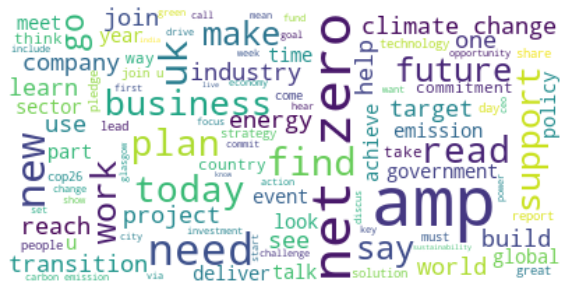

In [25]:
#wordcloud for positive tweets
create_wordcloud(data21_1112[data21_1112['sentiments_val']=="positive"]["cleaned_tweet"].values)